In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import os

import statsmodels.formula.api as smf
from src.utils.ECG_data_loading import ECG_classification_dataset_with_peak_features
from torch.utils.data import DataLoader

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
patient_ID = 637891
label = 0
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 10
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

# Load data

In [4]:
report_folder = "Reports"
report_name = "wandb_export_2022-12-06T18_41_14.378-05_00.csv"
# sweep_name = "20221004-ecg_p40-sup-clocs1d-bayes-norm01-wd-b4.yaml"
report_df = pd.read_csv(os.path.join(report_folder, report_name))
report_df

,Name,State,Created,End Time,Runtime,Sweep,Hostname,ID,lr,classifier_lr,embedding_dim,dim_feedforward,optimizer,seed,aug_prob,test_auroc,max_val_auroc,corresponding_train_auroc,epoch
0,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T06:03:57.000Z,2022-12-04T12:10:22.000Z,21985,fjtvwtqe,beast3,cqpywv9j,0.005,0.001,256,128,sgd,2,2.00,0.939464,0.950550,0.743956,61
1,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T05:19:55.000Z,2022-12-04T13:01:23.000Z,27688,fjtvwtqe,beast1,g09je3xq,0.005,0.001,256,128,adam,4,2.00,0.951888,0.950173,0.739453,44
2,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-03T06:01:52.000Z,2022-12-04T05:19:37.000Z,83865,fjtvwtqe,beast1,s6qzuo6i,0.005,0.001,256,128,adam,0,1.25,0.950647,0.949504,0.762973,199
3,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-03T12:51:25.000Z,2022-12-03T21:38:59.000Z,31654,fjtvwtqe,ankitlab2,ln944xn9,0.005,0.001,256,128,sgd,2,1.50,0.913096,0.948688,0.755173,64
4,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T08:30:30.000Z,2022-12-04T14:12:25.000Z,20515,fjtvwtqe,beast3,nd75tvsb,0.005,0.010,256,128,adam,1,2.00,0.935905,0.946020,0.749772,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-02T21:30:14.000Z,2022-12-03T02:55:04.000Z,19490,fjtvwtqe,beast3,reayoylb,0.005,0.001,256,128,sgd,3,0.00,0.936111,0.674359,0.779431,98
356,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T17:08:13.000Z,2022-12-04T20:17:59.000Z,11386,fjtvwtqe,ankitlab2,1jk7rr96,0.005,0.001,256,128,sgd,2,0.00,0.462983,0.661115,0.510673,40
357,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T16:58:53.000Z,2022-12-04T18:41:27.000Z,6154,fjtvwtqe,beast3,dswvngnt,0.001,0.001,256,128,sgd,2,0.00,0.888334,0.617412,0.774837,56
358,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T03:37:55.000Z,2022-12-04T07:14:42.000Z,13007,fjtvwtqe,beast3,gtb1crpw,0.001,0.001,256,128,sgd,1,2.00,0.502832,0.611221,0.506287,40


In [5]:
for column in ["lr", "classifier_lr", "optimizer", "aug_prob", "seed"]:
    print(column, len(report_df[column].unique()), report_df[column].unique())

lr 2 [0.005 0.001]
classifier_lr 2 [0.001 0.01 ]
optimizer 2 ['sgd' 'adam']
aug_prob 9 [2.   1.25 1.5  1.75 0.5  0.75 0.25 1.   0.  ]
seed 5 [2 4 0 1 3]


# Analyze Results

In [6]:
selected_columns = ["lr", "classifier_lr", "optimizer", "aug_prob", "seed", "max_val_auroc", "test_auroc"]
report_df_selected = report_df[selected_columns]

In [7]:
report_df_selected

,lr,classifier_lr,optimizer,aug_prob,seed,max_val_auroc,test_auroc
0,0.005,0.001,sgd,2.00,2,0.950550,0.939464
1,0.005,0.001,adam,2.00,4,0.950173,0.951888
2,0.005,0.001,adam,1.25,0,0.949504,0.950647
3,0.005,0.001,sgd,1.50,2,0.948688,0.913096
4,0.005,0.010,adam,2.00,1,0.946020,0.935905
...,...,...,...,...,...,...,...
355,0.005,0.001,sgd,0.00,3,0.674359,0.936111
356,0.005,0.001,sgd,0.00,2,0.661115,0.462983
357,0.001,0.001,sgd,0.00,2,0.617412,0.888334
358,0.001,0.001,sgd,2.00,1,0.611221,0.502832


## Find the best performing runs based on `max_val_auroc` for each (`aug_prob`, `seed`)

In [8]:
# report_df_selected_summary = report_df_selected.groupby(["aug_prob", "seed"]).agg({"max_val_auroc": "max"})
# report_df_selected_summary_sorted = report_df_selected_summary.sort_values(by=["max_val_auroc"], ascending=False).reset_index()
# report_df_selected_summary
# best_lr = report_df_selected_summary_sorted.reset_index()["lr"].values[0]
# best_classifier_lr = report_df_selected_summary_sorted.reset_index()["classifier_lr"].values[0]
# best_optimizer = report_df_selected_summary_sorted.reset_index()["optimizer"].values[0]
# # best_lr, best_classifier_lr, best_optimizer
# report_df_selected_summary_sorted

In [9]:
report_df_selected_tuned = report_df_selected.loc[report_df_selected.groupby(["aug_prob", "seed"])["max_val_auroc"].idxmax()]
report_df_selected_tuned


,lr,classifier_lr,optimizer,aug_prob,seed,max_val_auroc,test_auroc
251,0.001,0.001,adam,0.00,0,0.886137,0.930457
226,0.001,0.010,adam,0.00,1,0.896627,0.907046
255,0.001,0.001,adam,0.00,2,0.884389,0.897124
272,0.005,0.001,adam,0.00,3,0.872796,0.909950
299,0.005,0.010,adam,0.00,4,0.847382,0.906333
18,0.005,0.001,adam,0.25,0,0.937522,0.926578
125,0.001,0.010,adam,0.25,1,0.918226,0.914997
93,0.005,0.001,adam,0.25,2,0.922634,0.933512
118,0.001,0.010,adam,0.25,3,0.919538,0.922155
169,0.005,0.010,adam,0.25,4,0.911630,0.934401


In [10]:
report_df_selected_tuned_summary = report_df_selected_tuned.groupby(["aug_prob"]).agg({"test_auroc": "mean"}).reset_index()
report_df_selected_tuned_summary

,aug_prob,test_auroc
0,0.00,0.910182
1,0.25,0.926329
2,0.50,0.922543
3,0.75,0.930456
4,1.00,0.930862
5,1.25,0.943331
6,1.50,0.926419
7,1.75,0.926142
8,2.00,0.939529


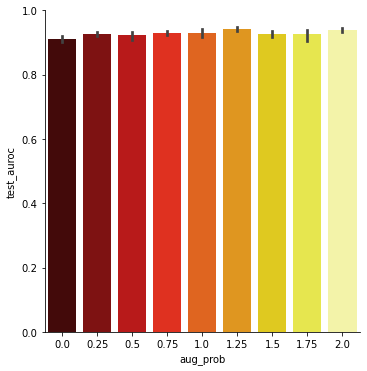

In [9]:
g = sns.catplot(data=report_df_selected_tuned,
                x="aug_prob", y="test_auroc",
                kind="bar", palette="hot")
for ax_row in g.axes:
    for ax in ax_row:
        ax.set_ylim(0, 1.0)

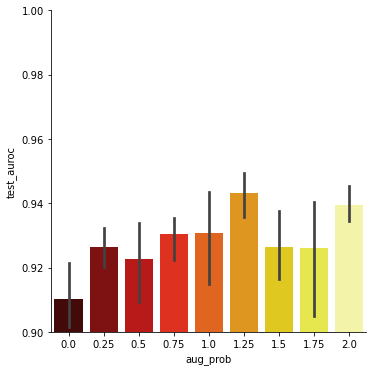

In [10]:
g = sns.catplot(data=report_df_selected_tuned,
                x="aug_prob", y="test_auroc",
                kind="bar", palette="hot")
for ax_row in g.axes:
    for ax in ax_row:
        ax.set_ylim(0.9, 1.0)

## 'max_val_auroc' vs 'test_auroc' plot

In [11]:
report_df_selected.sort_values(by=["max_val_auroc"], ascending=False)

,lr,classifier_lr,optimizer,aug_prob,seed,max_val_auroc,test_auroc
0,0.005,0.001,sgd,2.00,2,0.950550,0.939464
1,0.005,0.001,adam,2.00,4,0.950173,0.951888
2,0.005,0.001,adam,1.25,0,0.949504,0.950647
3,0.005,0.001,sgd,1.50,2,0.948688,0.913096
4,0.005,0.010,adam,2.00,1,0.946020,0.935905
...,...,...,...,...,...,...,...
355,0.005,0.001,sgd,0.00,3,0.674359,0.936111
356,0.005,0.001,sgd,0.00,2,0.661115,0.462983
357,0.001,0.001,sgd,0.00,2,0.617412,0.888334
358,0.001,0.001,sgd,2.00,1,0.611221,0.502832


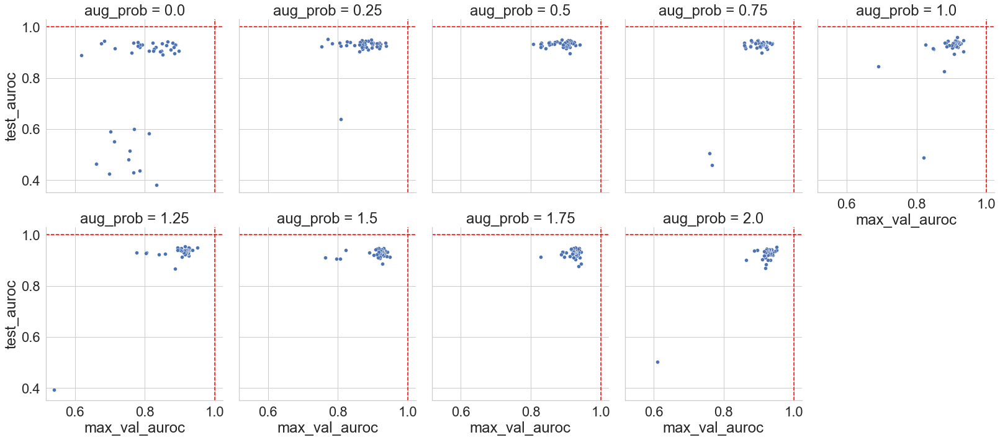

In [12]:
sns.set(style="whitegrid", font_scale=2)
g = sns.relplot(data=report_df_selected,
                x="max_val_auroc", y="test_auroc",
                col="aug_prob", palette="hot",
                col_wrap=5,
                aspect=0.9, height=5)
for i, ax in enumerate(g.axes):
#     for j, ax in enumerate(ax_row):
    ax.axhline(1.0, color="#FF0000", linestyle="--")
    ax.axvline(1.0, color="#FF0000", linestyle="--")

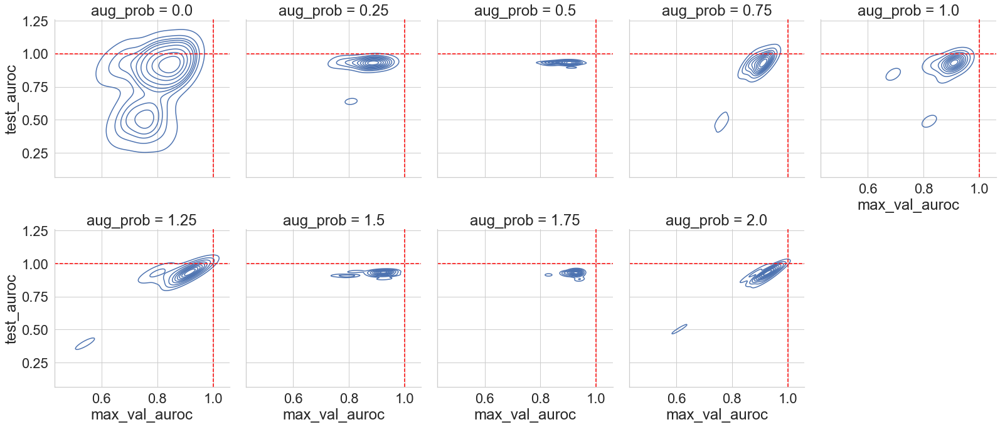

In [13]:
g = sns.FacetGrid(report_df_selected, col="aug_prob", col_wrap=5, height=5, aspect=0.9)
g.map(sns.kdeplot, "max_val_auroc", "test_auroc")
for i, ax in enumerate(g.axes):
#     for j, ax in enumerate(ax_row):
    ax.axhline(1.0, color="#FF0000", linestyle="--")
    ax.axvline(1.0, color="#FF0000", linestyle="--")
        

## Find the best performing subgroup with the same `lr`, `claasifier_lr` and `optimizer`

In [14]:
# report_df_selected_summary = report_df_selected.groupby(["lr", "classifier_lr", "optimizer"]).agg({"max_val_auroc": "mean"})
# report_df_selected_summary_sorted = report_df_selected_summary.sort_values(by=["test_auroc"], ascending=False)
# best_lr = report_df_selected_summary_sorted.reset_index()["lr"].values[0]
# best_classifier_lr = report_df_selected_summary_sorted.reset_index()["classifier_lr"].values[0]
# best_optimizer = report_df_selected_summary_sorted.reset_index()["optimizer"].values[0]
# # best_lr, best_classifier_lr, best_optimizer
# report_df_selected_summary_sorted

In [15]:
# report_df_selected_filtered = report_df_selected.query(
#     f"lr == {best_lr} and classifier_lr == {best_classifier_lr} and optimizer == '{best_optimizer}'").reset_index(drop=True)
# report_df_selected_filtered = report_df_selected_filtered.sort_values(by=["aug_prob", "seed"])
# report_df_selected_filtered


In [16]:
# g = sns.catplot(data=report_df_selected,
#                 x="aug_prob", y="test_auroc",
#                 kind="bar", palette="hot")
# for ax_row in g.axes:
#     for ax in ax_row:
#         ax.set_ylim(0, 1.0)

In [17]:
# g = sns.catplot(data=report_df_selected,
#                 x="aug_prob", y="test_auroc",
#                 kind="bar", palette="hot")
# for ax_row in g.axes:
#     for ax in ax_row:
#         ax.set_ylim(0.85, 1.0)

In [18]:
# g = sns.catplot(data=report_df_selected_filtered,
#                 x="aug_prob", y="test_auroc",
#                 kind="bar", palette="hot")
# for ax_row in g.axes:
#     for ax in ax_row:
#         ax.set_ylim(0, 1.0)

In [19]:
# g = sns.catplot(data=report_df_selected_filtered,
#                 x="aug_prob", y="test_auroc",
#                 kind="bar", palette="hot")
# for ax_row in g.axes:
#     for ax in ax_row:
#         ax.set_ylim(0.85, 1.0)

## Find the best performing subgroup with the same `lr`, `claasifier_lr`, `optimizer` and 'aug_prob'

In [20]:
selected_columns = ["lr", "classifier_lr", "optimizer", "aug_prob", "seed", "test_auroc"]
report_df_selected = report_df[selected_columns]
report_df_selected_summary = report_df_selected.groupby(["lr", "classifier_lr", "optimizer", "aug_prob"]).agg({"test_auroc": "mean"})
report_df_selected_summary_sorted = report_df_selected_summary.sort_values(by=["test_auroc"], ascending=False)
best_lr = report_df_selected_summary_sorted.reset_index()["lr"].values[0]
best_classifier_lr = report_df_selected_summary_sorted.reset_index()["classifier_lr"].values[0]
best_optimizer = report_df_selected_summary_sorted.reset_index()["optimizer"].values[0]
# best_lr, best_classifier_lr, best_optimizer
report_df_selected_summary_sorted

test_auroc
lr    classifier_lr optimizer aug_prob            
0.005 0.001         adam      1.00        0.942020
                              1.25        0.941664
      0.010         adam      1.00        0.940092
0.001 0.001         adam      1.75        0.939367
0.005 0.010         adam      0.25        0.938835
...                                            ...
0.001 0.001         sgd       1.25        0.819811
0.005 0.001         adam      0.00        0.810866
0.001 0.010         sgd       0.00        0.772814
      0.001         sgd       0.00        0.735040
0.005 0.001         sgd       0.00        0.566934

[72 rows x 1 columns]

# Summarize Report

In [21]:
# report_df_summary = report_df.groupby(["embedding_dim", "weight_decay", "lr", "classifier_lr"]).agg({
#     "val_auroc": "mean"
# }).reset_index()
# report_df_summary

In [22]:
# report_df.sort_values(by=["val_auroc"], ascending=False).head(32)

In [23]:
# g = sns.factorplot(data=report_df, x="embedding_dim", y="val_auroc", hue="weight_decay", col="classifier_lr")

In [24]:
# model = smf.ols("val_auroc ~ embedding_dim + classifier_lr + weight_decay", report_df, ).fit()
# model.summary()

In [25]:
# report_df_tmp = report_df.copy()
# report_df_tmp["weight_decay"] = report_df_tmp["weight_decay"] + 1e-7
# model = smf.ols("val_auroc ~ np.log(embedding_dim) + np.log(classifier_lr) + np.log(weight_decay)", report_df_tmp, ).fit()
# model.summary()

# XAI Tools

In [11]:
import math

In [12]:
report_df_sorted = report_df.sort_values(by=["max_val_auroc"], ascending=False)
report_df_sorted.head()

,Name,State,Created,End Time,Runtime,Sweep,Hostname,ID,lr,classifier_lr,embedding_dim,dim_feedforward,optimizer,seed,aug_prob,test_auroc,max_val_auroc,corresponding_train_auroc,epoch
0,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T06:03:57.000Z,2022-12-04T12:10:22.000Z,21985,fjtvwtqe,beast3,cqpywv9j,0.005,0.001,256,128,sgd,2,2.00,0.939464,0.950550,0.743956,61
1,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T05:19:55.000Z,2022-12-04T13:01:23.000Z,27688,fjtvwtqe,beast1,g09je3xq,0.005,0.001,256,128,adam,4,2.00,0.951888,0.950173,0.739453,44
2,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-03T06:01:52.000Z,2022-12-04T05:19:37.000Z,83865,fjtvwtqe,beast1,s6qzuo6i,0.005,0.001,256,128,adam,0,1.25,0.950647,0.949504,0.762973,199
3,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-03T12:51:25.000Z,2022-12-03T21:38:59.000Z,31654,fjtvwtqe,ankitlab2,ln944xn9,0.005,0.001,256,128,sgd,2,1.50,0.913096,0.948688,0.755173,64
4,supervised-clocsCNN_1D-ECG_normalized-20221202...,finished,2022-12-04T08:30:30.000Z,2022-12-04T14:12:25.000Z,20515,fjtvwtqe,beast3,nd75tvsb,0.005,0.010,256,128,adam,1,2.00,0.935905,0.946020,0.749772,70


In [13]:
best_run_ID = report_df_sorted["ID"].values[0]
best_run_ID = report_df_sorted["ID"].values[1]
best_run_ID

'g09je3xq'

## Load data

In [65]:
data_folder = ""
data_chunk_folder = "ecg-pat40-tch-sinus_jet_lead2"
data_chunk_list = []
for data_filename in os.listdir(os.path.join(data_folder, data_chunk_folder)):
    data_chunk_list.append(pd.read_csv(os.path.join(data_folder, data_chunk_folder, data_filename)))
feature_df_all_selected_with_ecg = pd.concat(data_chunk_list, axis=0)
channel_ID = 2

In [97]:
feature_with_ecg_df_train_single_lead = feature_df_all_selected_with_ecg.query(f"patient_ID in {patient_ID_list_dev}").query(f"channel_ID == {channel_ID}")

In [66]:
feature_with_ecg_df_val_single_lead = pd.read_csv("feature_with_ecg_df_val_lead2.csv")
feature_with_ecg_df_test_single_lead = pd.read_csv("feature_with_ecg_df_test_lead2.csv")
feature_with_ecg_df_test_single_lead

,cycle_ID,patient_ID,interval_ID,block_ID,channel_ID,segment_ID,start_ID,end_ID,r_ID,r_t,...,ecg295,ecg296,ecg297,ecg298,ecg299,ecg300,r_ID_abs,r_ID_abs_ref,selected,duration
0,1,771495,8748755,1,2,1,1,66705,820,2015-12-22 23:12:04.099549952,...,1.290715,1.403295,1.606575,1.857944,2.039397,2.014317,820,820,True,277.528
1,2,771495,8748755,1,2,1,1,66705,907,2015-12-22 23:12:04.461459968,...,1.152530,1.248552,1.434638,1.692337,1.924521,1.995100,907,907,True,277.528
2,3,771495,8748755,1,2,1,1,66705,994,2015-12-22 23:12:04.823380224,...,0.954466,1.053145,1.247815,1.520770,1.775172,1.874207,994,994,True,277.528
3,4,771495,8748755,1,2,1,1,66705,1085,2015-12-22 23:12:05.201929984,...,1.468770,1.449762,1.533679,1.723174,1.924213,1.983855,1085,1085,True,277.528
4,5,771495,8748755,1,2,1,1,66705,1167,2015-12-22 23:12:05.543040000,...,1.150959,1.294285,1.518599,1.771597,1.948649,1.938984,1167,1167,True,277.528
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114407,308,536886,8748726,1,2,2,4442,31910,27061,2015-01-06 01:31:59.848000000,...,0.521465,0.680327,0.817151,0.849854,0.728921,0.478241,31502,31502,True,132.808
114408,309,536886,8748726,1,2,2,4442,31910,27157,2015-01-06 01:32:00.247380224,...,0.482723,0.645244,0.786819,0.825585,0.711836,0.468551,31598,31598,True,132.808
114409,310,536886,8748726,1,2,2,4442,31910,27253,2015-01-06 01:32:00.646749952,...,0.497711,0.666044,0.814049,0.855897,0.739084,0.487000,31694,31694,True,132.808
114410,311,536886,8748726,1,2,2,4442,31910,27349,2015-01-06 01:32:01.046129920,...,0.541680,0.717542,0.873392,0.916993,0.791512,0.521507,31790,31790,True,132.808


In [98]:
train_dataset = ECG_classification_dataset_with_peak_features(feature_with_ecg_df_train_single_lead,
                                                                     shift_signal=False,
                                                                     shift_amount=0,
                                                                     normalize_signal=True,
                                                                     ecg_resampling_length_target=300)
train_loader = DataLoader(
    train_dataset, batch_size=128, num_workers=1, shuffle=False, drop_last=False
)

In [68]:
val_dataset = ECG_classification_dataset_with_peak_features(feature_with_ecg_df_val_single_lead,
                                                                     shift_signal=False,
                                                                     shift_amount=0,
                                                                     normalize_signal=True,
                                                                     ecg_resampling_length_target=300)

test_dataset = ECG_classification_dataset_with_peak_features(feature_with_ecg_df_test_single_lead,
                                                                     shift_signal=False,
                                                                     shift_amount=0,
                                                                     normalize_signal=True,
                                                                     ecg_resampling_length_target=300)

val_loader = DataLoader(
    val_dataset, batch_size=128, num_workers=1, shuffle=False, drop_last=False
)
test_loader = DataLoader(
    test_dataset, batch_size=128, num_workers=1, shuffle=False, drop_last=False
)

### Save test data as dict for lookup later

In [99]:
from torch.utils.data import Dataset
import torch
from src.utils.ECG_data_loading import ECG_classification_dataset_with_peak_features, Transform_frame, Normalize

class ECG_classification_dataset_with_peak_features(Dataset):
    def __init__(self, feature_df_all_selected_p_ind_with_ecg, ecg_resampling_length_target=300,
                 peak_loc_name="p_ind_resampled", label_name="label", short_identifier_list=None,
                 peak_feature_name_list=None, shift_signal=False, shift_amount=None, normalize_signal=False,
                 transforms=None, dataset_name="ecg-TCH-40_patient-20220201", aug_prob=0,
                 return_original_signal=None, return_id_vec=False):
        """
            normalize_signal: Normalize each individual signal to 0 - 1 range
        """
        # print(f"ecg_resampling_length_target: {ecg_resampling_length_target}")
        if short_identifier_list is None:
            short_identifier_list = ['patient_ID', 'interval_ID', 'block_ID', 'channel_ID', 'r_ID_abs', 'label',
                                     'r_ID_abs_ref']
        if peak_feature_name_list is None:
            peak_feature_name_list = ["p_prom_med", "pr_int_iqr"]

        if transforms is None:
            self.transforms = []
        else:
            if isinstance(transforms, str):
                transforms = [transforms]
            self.transforms = [Lower(ele) for ele in transforms]

        self.dataset_name = dataset_name
        self.short_identifier_list = short_identifier_list
        self.peak_feature_name_list = peak_feature_name_list
        self.label_name = label_name
        self.device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
        self.feature_df_all_selected_p_ind_with_ecg = feature_df_all_selected_p_ind_with_ecg
        self.ecg_resampling_length = 300
        self.ecg_resampling_length_target = ecg_resampling_length_target
        self.ecg_colnames = [f"ecg{i + 1}" for i in range(self.ecg_resampling_length)]
        self.peak_loc_name = peak_loc_name
        self.ecg_mat = self.feature_df_all_selected_p_ind_with_ecg[self.ecg_colnames].values
        self.peak_label_list = self.feature_df_all_selected_p_ind_with_ecg[self.peak_loc_name].values
        self.label_list = self.feature_df_all_selected_p_ind_with_ecg[self.label_name].values
        self.short_identifier_mat = self.feature_df_all_selected_p_ind_with_ecg[self.short_identifier_list].values
        self.peak_feature_mat = self.feature_df_all_selected_p_ind_with_ecg[self.peak_feature_name_list].values
        self.return_id_vec = return_id_vec

        self.shift_signal = shift_signal
        self.shift_amount = shift_amount
        self.normalize_signal = normalize_signal
        self.aug_prob = aug_prob
        if self.shift_signal:
            if self.shift_amount is None:
                self.shift_amount = 0
            self.ecg_mat -= self.shift_amount  # Shift ECG to 0 baseline

        if self.normalize_signal:
            ecg_min = np.min(self.ecg_mat, axis=1)[:, np.newaxis]
            ecg_max = np.max(self.ecg_mat, axis=1)[:, np.newaxis]
            self.ecg_mat = (self.ecg_mat - ecg_min) / (ecg_max - ecg_min)

        if return_original_signal is None:
            self.return_original_signal = True
            if len(self.transforms) == 0 or \
                    (len(self.transforms) == 1 \
                     and Lower(self.transforms[0]) in [
                         Lower("Identity"), Lower("SelectedAug_20221025"), Lower("SelectedAug_20221029")]):
                self.return_original_signal = False
        else:
            self.return_original_signal = return_original_signal

    def obtain_perturbed_frame(self, frame):
        frame = Transform_frame(frame, transforms=self.transforms, dataset_name=self.dataset_name,
                                aug_prob=self.aug_prob)
        return frame

    def __len__(self):
        return len(self.feature_df_all_selected_p_ind_with_ecg)

    def __getitem__(self, idx):
        X = self.ecg_mat[idx, :]
        if self.ecg_resampling_length_target != self.ecg_resampling_length:
            X = resample_poly(X, self.ecg_resampling_length_target, self.ecg_resampling_length,
                              padtype="line")
        X = Normalize(X)
        X_aug = self.obtain_perturbed_frame(X)
        peak_idx = self.peak_label_list[idx]
        label = self.label_list[idx]
        id_vec = self.short_identifier_mat[idx, :]
        peak_features = self.peak_feature_mat[idx, :]

        # return X[np.newaxis, :], peak_idx, label, id_vec, peak_features[np.newaxis, :]
        if self.return_id_vec:
            return X_aug[np.newaxis, :], id_vec, label
        else:
            if self.return_original_signal:
                return (X[np.newaxis, :], X_aug[np.newaxis, :]), label
            else:
                return X_aug[np.newaxis, :], label

In [100]:
train_dataset_with_id = ECG_classification_dataset_with_peak_features(feature_with_ecg_df_train_single_lead,
                                                                     shift_signal=False,
                                                                     shift_amount=0,
                                                                     normalize_signal=True,
                                                                     ecg_resampling_length_target=300,
                                                                     return_id_vec=True)

In [64]:
feature_with_ecg_df_train_single_lead["patient_ID"].unique()

array([387479, 398573, 551554, 577874, 581650, 595561, 609090, 624179,
       628521, 631270, 637891, 642321, 655769, 417349, 662493, 667681,
       678607, 678877, 681150, 725860, 740475, 741235, 748555, 748900,
       756172, 424072, 759678, 771495, 782501, 803389, 824744, 844864,
       462229, 477589, 510915, 536886, 537854, 515544, 533362, 771958],
      dtype=object)

In [279]:
test_dataset_with_id = ECG_classification_dataset_with_peak_features(feature_with_ecg_df_test_single_lead,
                                                                     shift_signal=False,
                                                                     shift_amount=0,
                                                                     normalize_signal=True,
                                                                     ecg_resampling_length_target=300,
                                                                     return_id_vec=True)

In [120]:
test_dataset_with_id.short_identifier_list

['patient_ID',
 'interval_ID',
 'block_ID',
 'channel_ID',
 'r_ID_abs',
 'label',
 'r_ID_abs_ref']

In [41]:
def Get_dataset_id_dict(dataset):
    dataset_id_dict = {}
    for i, (x, id_vec, y) in enumerate(dataset):
        ECG_signal = x.ravel()
        ECG_signal_str = "_".join([f"{ele:.3f}" for ele in ECG_signal])
        id_dict = dict(zip(dataset.short_identifier_list, id_vec))
        id_dict["label"] = y
        dataset_id_dict[ECG_signal_str] = id_dict
    return dataset_id_dict

# dataset = test_dataset_with_id
# dataset_id_dict = {}
# for i, (x, id_vec, y) in enumerate(dataset):
#     ECG_signal = x.ravel()
#     ECG_signal_str = "_".join([f"{ele:.3f}" for ele in ECG_signal])
#     id_dict = dict(zip(dataset.short_identifier_list, id_vec))
#     id_dict["label"] = y
    
# #     print(i, ECG_signal_str, id_dict)
#     dataset_id_dict[ECG_signal_str] = id_dict
#     break
    
dataset_id_dict_train = Get_dataset_id_dict(train_dataset_with_id)
# dataset_id_dict_test = Get_dataset_id_dict(test_dataset_with_id)

In [42]:
def Lookup_ECG(ECG_signal, dataset_id_dict):
    ECG_signal = ECG_signal.ravel()
    ECG_signal_str = "_".join([f"{ele:.3f}" for ele in ECG_signal])
    id_dict = dataset_id_dict.get(ECG_signal_str)
    return id_dict

In [130]:
Lookup_ECG(test_dataset_with_id[1][0], dataset_id_dict_test)

{'patient_ID': 771495,
 'interval_ID': 8748755,
 'block_ID': 1,
 'channel_ID': 2,
 'r_ID_abs': 907,
 'label': 0,
 'r_ID_abs_ref': 907}

In [132]:
test_dataset_with_id[1][1], test_dataset_with_id[1][2]

(array([ 771495, 8748755,       1,       2,     907,       0,     907]), 0)

### Check if the initial trends correlates to the labels

In [90]:
def Get_avg_diff_df(dataset):
    avg_diff_list = []
    label_list = []
    for i, (x, y) in enumerate(dataset):
    #     print(i, x.shape, y.shape)
        ecg_signal = x.ravel()
        segment_length = 20
        ecg_signal_segment = ecg_signal[:segment_length]
        ecg_signal_segment_lag = ecg_signal[1:(segment_length + 1)]
        avg_diff = np.mean(ecg_signal_segment_lag - ecg_signal_segment)
        avg_diff_list.append(avg_diff)
        label_list.append(y)
    avg_diff_df = pd.DataFrame.from_dict({"avg_diff": avg_diff_list, "label": label_list})
    return avg_diff_df

avg_diff_df_val = Get_avg_diff_df(val_dataset)
avg_diff_df_test = Get_avg_diff_df(test_dataset)

<AxesSubplot:xlabel='avg_diff', ylabel='Count'>

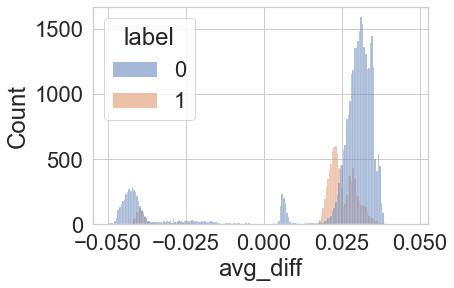

In [91]:
sns.histplot(data=avg_diff_df_val, x="avg_diff", hue="label")

<AxesSubplot:xlabel='avg_diff', ylabel='Count'>

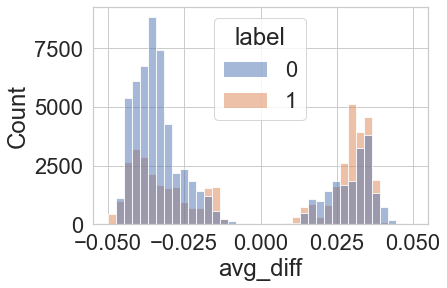

In [92]:
sns.histplot(data=avg_diff_df_test, x="avg_diff", hue="label")

In [93]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(avg_diff_df_val[["avg_diff"]], avg_diff_df_val["label"].values)
model.__dict__

{'penalty': 'l2',
 'dual': False,
 'tol': 0.0001,
 'C': 1.0,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'class_weight': None,
 'random_state': None,
 'solver': 'lbfgs',
 'max_iter': 100,
 'multi_class': 'auto',
 'verbose': 0,
 'warm_start': False,
 'n_jobs': None,
 'l1_ratio': None,
 'feature_names_in_': array(['avg_diff'], dtype=object),
 'n_features_in_': 1,
 'classes_': array([0, 1]),
 'n_iter_': array([15], dtype=int32),
 'coef_': array([[-3.03705034]]),
 'intercept_': array([-1.09373966])}

In [96]:
matching_prediction = model.predict(avg_diff_df_val[["avg_diff"]]) == avg_diff_df_val["label"].values
accuracy_val = np.sum(matching_prediction) / len(matching_prediction)
accuracy_val

0.7601905060036223

In [88]:
from sklearn.metrics import roc_auc_score

In [95]:
predicted_proba = model.predict_proba(avg_diff_df_val[["avg_diff"]])
auroc_val = roc_auc_score(avg_diff_df_val["label"].values, predicted_proba[:, 1])
auroc_val

0.7171155714493558

In [97]:
matching_prediction = model.predict(avg_diff_df_test[["avg_diff"]]) == avg_diff_df_test["label"].values
accuracy_val = np.sum(matching_prediction) / len(matching_prediction)
accuracy_val

0.5994913121001294

In [98]:
predicted_proba = model.predict_proba(avg_diff_df_test[["avg_diff"]])
auroc_val = roc_auc_score(avg_diff_df_test["label"].values, predicted_proba[:, 1])
auroc_val

0.3788815508776242

In [59]:
avg_diff_df_indexed = avg_diff_df.sort_values(by=["label", "avg_diff"]).reset_index(drop=True).reset_index(drop=False)
avg_diff_df_indexed

,index,avg_diff,label
0,0,-0.050000,0
1,1,-0.049806,0
2,2,-0.049770,0
3,3,-0.049741,0
4,4,-0.049313,0
...,...,...,...
44718,44718,0.039883,1
44719,44719,0.040020,1
44720,44720,0.040456,1
44721,44721,0.040518,1


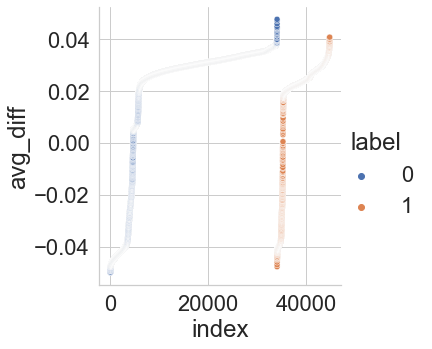

In [60]:
sns.relplot(data=avg_diff_df_indexed, x="index", y="avg_diff", hue="label")

(-0.06, 0.06)

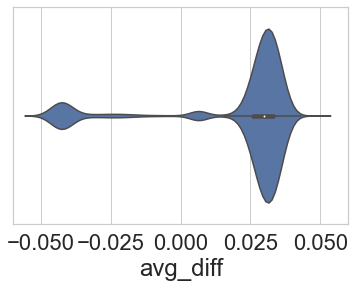

In [100]:
g = sns.violinplot(data=avg_diff_df_indexed.query(f"label == 0"), x="avg_diff", hue="label")
g.axes.set_xlim(-0.060, 0.060)

(-0.06, 0.06)

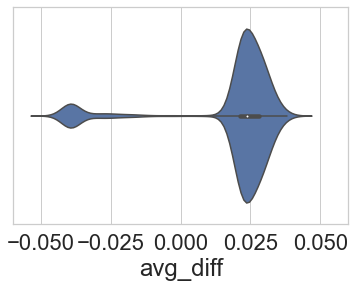

In [101]:
g = sns.violinplot(data=avg_diff_df_indexed.query(f"label == 1"), x="avg_diff", hue="label")
g.axes.set_xlim(-0.060, 0.060)

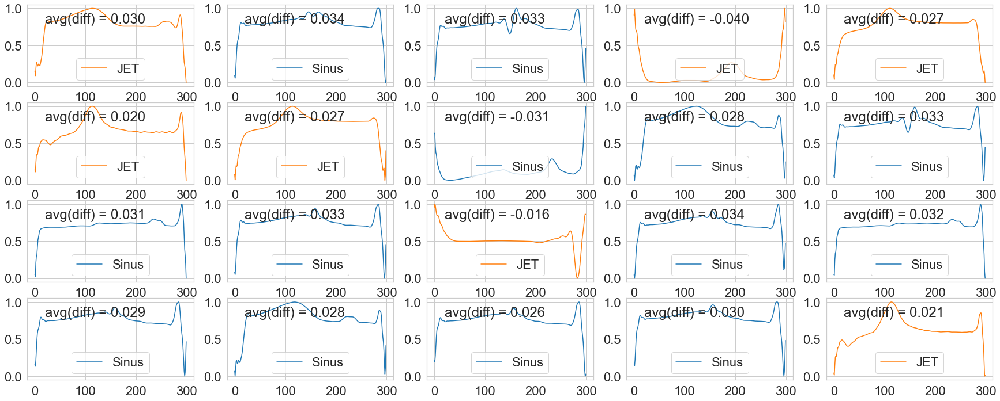

In [137]:
torch.manual_seed(1)
val_loader = DataLoader(
    val_dataset, batch_size=128, num_workers=1, shuffle=True, drop_last=False
)
show_num = 20
ncol = 5
nrow = show_num // ncol
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 6, nrow * 3))
for i, (x, y) in enumerate(val_loader):
#     print(i, x, y)
#     print(x.shape)
    
    for j in range(show_num):
        r = j // ncol
        c = j % ncol
        ax = axes[r, c]
        label = y.detach().numpy().ravel()[j]
        color = cm.tab10(label)
        label_dict = {0: "Sinus", 1: "JET"}
        ecg_signal = x[j].detach().numpy().ravel()
        segment_length = 20
        ecg_signal_segment = ecg_signal[:segment_length]
        ecg_signal_segment_lag = ecg_signal[1:(segment_length + 1)]
        ecg_signal_segment_diff = np.mean(ecg_signal_segment_lag - ecg_signal_segment)
        ax.plot(ecg_signal, color=color, label=label_dict[label])
        ax.text(20, 0.8, f"avg(diff) = {ecg_signal_segment_diff:.3f}")
        ax.legend(loc="lower center")
    break

## Load model

In [20]:
from torch.utils.data import DataLoader
from src.methods.supervised_1d import SupervisedModel_1D
from src.models.CLOCS_1D import cnn_network_contrastive
import torch.nn as nn
from pathlib import Path
from src.utils.metrics import accuracy_at_k, weighted_mean, AUROC
from src.utils.ECG_data_loading import *
import time

In [21]:
embedding_dim = 256
# embedding_dim = 1
model = cnn_network_contrastive(zero_init_residual=None, embedding_dim=embedding_dim,
                   stride=2, c4_multiplier=3)
# remove fc layer
model.fc = nn.Identity()

2 0.1 0.1 0.1 1 256 CLOCS 
Using kernel size: 7
c1, c2, k, s, c3, c4, c4_multiplier, embedding_dim: (1, 4, 7, 2, 16, 32, 3, 256)


In [22]:
# build paths
## embedding dim = 16
# ckpt_dir = Path("trained_models/linear/wxjvsino")
# ckpt_dir = Path("trained_models/linear/88v49oih")
ckpt_dir = Path(f"trained_models/linear/{best_run_ID}") # test_auroc = 0.9631

# ckpt_path = [ckpt_dir / ckpt for ckpt in os.listdir(ckpt_dir) if ckpt.endswith("val_auroc=0.9236.ckpt")][0]
max_val_auroc = max([float(ele.split("=")[-1].replace(".ckpt", "")) \
                     for ele in os.listdir(ckpt_dir) if "=" in ele and "val_auroc" in ele])
ckpt_path = [ckpt_dir / ckpt for ckpt in os.listdir(ckpt_dir) if ckpt.endswith(f"val_auroc={max_val_auroc}.ckpt")][0]
## embedding dim = 1
# ckpt_dir = Path("trained_models/linear/igtzgoky")
# ckpt_path = [ckpt_dir / ckpt for ckpt in os.listdir(ckpt_dir) if ckpt.endswith("val_auroc=0.9736.ckpt")][0]

args_path = ckpt_dir / "args.json"
print(f"args_path: {args_path}")
print(f"ckpt_path: {ckpt_path}")

# load arguments
with open(args_path) as f:
    method_args = json.load(f)
print(f"method_args {type(method_args)}: {method_args}")
# build the model
model.pretrained_occlusion_model_dict = None
method_args["backbone"] = model
model_loaded = SupervisedModel_1D.load_from_checkpoint(
    ckpt_path, strict=False, **method_args
)

args_path: trained_models\linear\g09je3xq\args.json
ckpt_path: trained_models\linear\g09je3xq\supervised-clocsCNN_1D-ECG_normalized-20221202_v30-maxep200-early_stopping_patience40-mixup-label_smoothing-aug_selected_20221029_prob0__2-g09je3xq-epoch=04-val_auroc=0.9502.ckpt
method_args <class 'dict'>: {'pretrained_feature_extractor': None, 'validation_frequency': 1, 'dataset': 'ecg-TCH-40_patient-20220201', 'data_dir': None, 'train_dir': None, 'val_dir': None, 'dali': False, 'dali_device': 'gpu', 'no_labels': True, 'debug': False, 'seed': 4, 'ptl_accelerator': 'ddp', 'cluster_name': 'auto', 'read_data_by_chunk': True, 'data_chunk_folder': 'ecg-pat40-tch-sinus_jet', 'channel_ID': 2, 'shift_signal': False, 'normalize_signal': True, 'ecg_resampling_length': 300, 'ecg_resampling_length_target': 300, 'stride': 2, 'c4_multiplier': 3, 'n_classes': 2, 'n_length': 300, 'num_layers': 3, 'd_model': 1, 'nhead': 1, 'dim_feedforward': 128, 'dropout': 0.1, 'activation': 'relu', 'use_raw_patch': False, 

C:\ProgramData\Anaconda3\envs\apy3.10\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


## Get AUROC

In [23]:
from sklearn import metrics
from sklearn.metrics import classification_report, roc_auc_score, roc_curve

In [101]:
def Get_roc_curve_df_from_model_and_data_loader(model, data_loader, target_fpr=0.1, target_threshold=None):
#     data_loader = test_loader

    X_all_list = []
    X_embedding_all_list = []
    y_true_all_list = []
    X_logits_all_list = []
    scores_all_list = []

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()
    auroc = AUROC(pos_label=1)
    softmax = torch.nn.Softmax(dim=1)

    for i, data in enumerate(data_loader):
#         print(f"Batch {i} / {len(data_loader)}")
        X, y = data
        X, y = X.to(device), y.to(device)
        X_all_list.append(X)
        X_embedding = model.backbone(X)
        X_logits = model.classifier(X_embedding)
    #     print(X_embedding.shape, y.shape)
    #     print(y)
    #     print(X_logits)
        X_embedding_all_list.append(X_embedding)
        y_true_all_list.append(y)
        X_logits_all_list.append(X_logits)

        scores = softmax(X_logits)[:, 1].detach().cpu()
        scores_all_list.append(scores)
        auroc.update(scores, y.detach().cpu())
    #     break

    auroc_value = auroc.compute()
    auroc.reset()
    print(f"auroc_value = {auroc_value:.4f}")
    X_all = torch.cat(X_all_list, dim=0)
    y_true_all = torch.cat(y_true_all_list, dim=0)
    scores_all = torch.cat(scores_all_list, dim=0)
    X_embedding_all = torch.cat(X_embedding_all_list, dim=0)
    X_embedding_all_np = X_embedding_all.detach().numpy()
    y_true_all_np = y_true_all.detach().numpy()
    scores_all_np = scores_all.detach().numpy()
#     X_all.shape, y_true_all.shape, scores_all.shape, X_embedding_all.shape

    y_scores = scores_all
    y_true = y_true_all_np
    
#     auroc = roc_auc_score(y_true, y_scores, average="weighted")
    auroc = auroc_value
    fpr, tpr, thresholds = roc_curve(y_true, y_scores, pos_label=1)
    roc_curve_df = pd.DataFrame([fpr, tpr, thresholds]).T
    roc_curve_df.columns=["fpr", "tpr", "thresholds"]
    if target_threshold is not None:
        closest_threshold_idx = np.argsort(np.abs(roc_curve_df["thresholds"] - target_threshold))[0]
    else:
        closest_threshold_idx = np.argsort(np.abs(roc_curve_df["fpr"] - target_fpr))[0]
    selected_threshold = roc_curve_df["thresholds"][closest_threshold_idx]
    selected_fpr = roc_curve_df["fpr"][closest_threshold_idx]
    roc_curve_results_dict = {"roc_curve_df": roc_curve_df, "selected_threshold": selected_threshold, "selected_fpr": selected_fpr, "auroc": auroc}
    return roc_curve_results_dict

In [102]:
target_fpr = 0.05
roc_curve_results_dict_train = Get_roc_curve_df_from_model_and_data_loader(
    model_loaded, train_loader, target_fpr=target_fpr, target_threshold=None)
target_threshold = roc_curve_results_dict_train["selected_threshold"]
target_threshold

C:\ProgramData\Anaconda3\envs\apy3.10\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


auroc_value = 0.9924


0.29838496446609497

In [103]:
target_fpr = 0.05
# target_fpr = 0.10
resulting_tpr = roc_curve_results_dict_train["roc_curve_df"].query(f"abs(fpr - {target_fpr}) < 0.0001")["tpr"].mean()
resulting_tpr

0.9806740097008892

In [285]:
target_fpr = 0.05
roc_curve_results_dict_val = Get_roc_curve_df_from_model_and_data_loader(
    model_loaded, val_loader, target_fpr=target_fpr, target_threshold=None)
target_threshold = roc_curve_results_dict_val["selected_threshold"]
roc_curve_results_dict_test = Get_roc_curve_df_from_model_and_data_loader(
    model_loaded, test_loader, target_threshold=target_threshold)

/Users/yj31/opt/anaconda3/envs/jpy3.7/lib/python3.7/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


auroc_value = 0.9502


/Users/yj31/opt/anaconda3/envs/jpy3.7/lib/python3.7/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


auroc_value = 0.9519


In [312]:
roc_curve_results_dict_test = Get_roc_curve_df_from_model_and_data_loader(
    model_loaded, test_loader, target_fpr=0.05, target_threshold=None)

/Users/yj31/opt/anaconda3/envs/jpy3.7/lib/python3.7/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


auroc_value = 0.9519


In [313]:
target_threshold = roc_curve_results_dict_test["selected_threshold"]
roc_curve_results_dict_val["selected_threshold"], roc_curve_results_dict_test["selected_threshold"]

(0.6016020774841309, 0.4129362106323242)

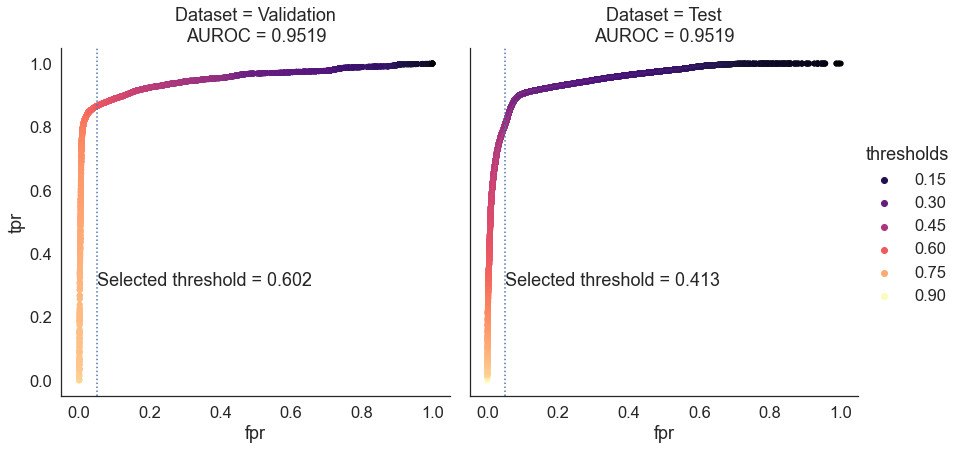

In [314]:
# roc_curve_results_dict_train["roc_curve_df"]["Dataset"] = "Training"
roc_curve_results_dict_val["roc_curve_df"]["Dataset"] = "Validation"
roc_curve_results_dict_test["roc_curve_df"]["Dataset"] = "Test"
roc_curve_df = pd.concat([
#     roc_curve_results_dict_train["roc_curve_df"],
    roc_curve_results_dict_val["roc_curve_df"],
    roc_curve_results_dict_test["roc_curve_df"]], axis=0)

g = sns.relplot(data=roc_curve_df.query("thresholds <= 1"), x="fpr", y="tpr", hue="thresholds", col="Dataset", height=6, kind="scatter", palette="magma",
                linewidth=0.01)
# g.axes[0][0].axvline(roc_curve_results_dict_train["selected_fpr"], linestyle=":")
# g.axes[0][0].text(roc_curve_results_dict_train["selected_fpr"], 0.3, f"Selected threshold = {roc_curve_results_dict_train['selected_threshold']:.3f}")
# g.axes[0][0].set_title(f"{g.axes[0][0].get_title()}\nAUROC = {roc_curve_results_dict_train['auroc']:.4f}")
g.axes[0][0].axvline(roc_curve_results_dict_val["selected_fpr"], linestyle=":")
g.axes[0][0].text(roc_curve_results_dict_val["selected_fpr"], 0.3, f"Selected threshold = {roc_curve_results_dict_val['selected_threshold']:.3f}")
g.axes[0][0].set_title(f"{g.axes[0][0].get_title()}\nAUROC = {roc_curve_results_dict_test['auroc']:.4f}")
g.axes[0][1].axvline(roc_curve_results_dict_test["selected_fpr"], linestyle=":")
g.axes[0][1].text(roc_curve_results_dict_test["selected_fpr"], 0.3, f"Selected threshold = {roc_curve_results_dict_test['selected_threshold']:.3f}")
g.axes[0][1].set_title(f"{g.axes[0][1].get_title()}\nAUROC = {roc_curve_results_dict_test['auroc']:.4f}")
suptitle = ""
# g.fig.suptitle(f"{suptitle} - ROC curve\n(target train FPR = {target_fpr})\n\n\n.")
# g.fig.suptitle(f"{suptitle} ROC\n\n.")
plt.show()

In [287]:
roc_curve_results_dict_test["roc_curve_df"].query(f"abs(fpr - 0.05) < 0.00001")

,fpr,tpr,thresholds,Dataset
5809,0.049993,0.806145,0.412946,Test
5810,0.049993,0.806189,0.412936,Test


In [288]:
target_fpr = 0.05
# target_fpr = 0.10
resulting_tpr = roc_curve_results_dict_test["roc_curve_df"].query(f"abs(fpr - {target_fpr}) < 0.0001")["tpr"].mean()
resulting_tpr

0.8062263128414405

In [289]:
target_fpr = 0.05
target_fpr = 0.10
resulting_tpr = roc_curve_results_dict_test["roc_curve_df"].query(f"abs(fpr - {target_fpr}) < 0.0001")["tpr"].mean()
resulting_tpr

0.9044329994398735

### Get_wrong_examples_indices_given_threshold

In [104]:
def Get_roc_curve_df_from_model_and_data_loader_for_wrong_predictions(model, data_loader, target_threshold=None):
#     data_loader = test_loader

    X_all_list = []
    X_embedding_all_list = []
    y_true_all_list = []
    X_logits_all_list = []
    scores_all_list = []
    wrong_indices_dict = {0: [], 1: []}

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    model.to(device)
    
    auroc = AUROC(pos_label=1)
    softmax = torch.nn.Softmax(dim=1)

    for i, data in enumerate(data_loader):
#         print(f"Batch {i} / {len(data_loader)}")
        X, y = data
        X, y = X.to(device), y.to(device)
        X_all_list.append(X)
        X_embedding = model.backbone(X)
        X_logits = model.classifier(X_embedding)
    #     print(X_embedding.shape, y.shape)
    #     print(y)
    #     print(X_logits)
        X_embedding_all_list.append(X_embedding)
        y_true_all_list.append(y)
        X_logits_all_list.append(X_logits)

        scores = softmax(X_logits)[:, 1].detach().cpu()
        scores_all_list.append(scores)
        auroc.update(scores, y.detach().cpu())
        
        for j, (score, label) in enumerate(zip(scores.numpy(), y.numpy())):
            if (label == 0 and score >= target_threshold) \
                or (label == 1 and score < target_threshold):
                wrong_indices_dict[label].append(i * len(y) + j)
    #     break

    auroc_value = auroc.compute()
    auroc.reset()
    print(f"auroc_value = {auroc_value:.4f}")
    X_all = torch.cat(X_all_list, dim=0)
    y_true_all = torch.cat(y_true_all_list, dim=0)
    scores_all = torch.cat(scores_all_list, dim=0)
    X_embedding_all = torch.cat(X_embedding_all_list, dim=0)
    X_embedding_all_np = X_embedding_all.detach().numpy()
    y_true_all_np = y_true_all.detach().numpy()
    scores_all_np = scores_all.detach().numpy()
#     X_all.shape, y_true_all.shape, scores_all.shape, X_embedding_all.shape

    y_scores = scores_all
    y_true = y_true_all_np
    return wrong_indices_dict



In [105]:
wrong_indices_dict_train = Get_roc_curve_df_from_model_and_data_loader_for_wrong_predictions(
    model_loaded, train_loader, target_threshold=target_threshold)

C:\ProgramData\Anaconda3\envs\apy3.10\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


auroc_value = 0.9924


In [ ]:
wrong_indices_dict_test = Get_roc_curve_df_from_model_and_data_loader_for_wrong_predictions(
    model_loaded, test_loader, target_threshold=target_threshold)

In [316]:
len(wrong_indices_dict_test[0]), len(wrong_indices_dict_test[1])

(3429, 8881)

In [317]:
target_threshold

0.4129362106323242

## Lime

https://github.com/emanuel-metzenthin/Lime-For-Time/blob/master/demo/LIME-Pipeline.ipynb

In [55]:
!pip install lime

     -------------------------------------- 275.7/275.7 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     --------------------------------------- 12.0/12.0 MB 46.9 MB/s eta 0:00:00
     ---------------------------------------- 3.4/3.4 MB 54.2 MB/s eta 0:00:00
     ---------------------------------------- 2.0/2.0 MB 65.6 MB/s eta 0:00:00
     ------------------------------------- 215.1/215.1 kB 12.8 MB/s eta 0:00:00
     ---------------------------------------- 4.2/4.2 MB 53.2 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=7de2f8726df5852e83e7c0815fa1f8cc3a33fee2ac21df45cfe0c59a3207aeb7
  Stored in directory: c:\users\juyil\appdata\local\pip\cache\wheels\fd\a2\af\9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime



[notice] A new release of pip available: 22.2.2 -> 23.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [57]:
from lime_timeseries import LimeTimeSeriesExplainer

In [58]:
softmax = torch.nn.Softmax(dim=1)

model_loaded.eval()
def Get_NN_predict_proba(model):
    def NN_predict_proba(X):
        X = torch.from_numpy(X)
        X = X.unsqueeze(1)
        X_embedding = model_loaded.backbone(X)
        X_logits = model_loaded.classifier(X_embedding)
        predict_proba = softmax(X_logits).detach().numpy()
        return predict_proba
    return NN_predict_proba
NN_predict_proba = Get_NN_predict_proba(model_loaded)

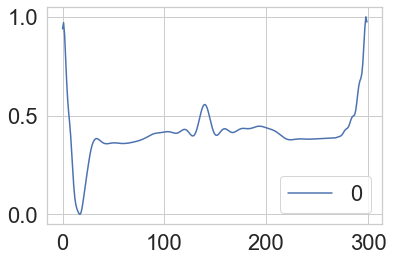

In [152]:
idx = 5
ecg_signal, label = test_dataset[idx]
ecg_signal = ecg_signal.ravel()
plt.plot(ecg_signal, label=label)
plt.legend()

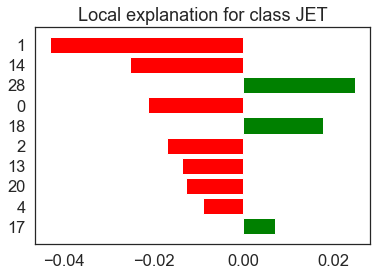

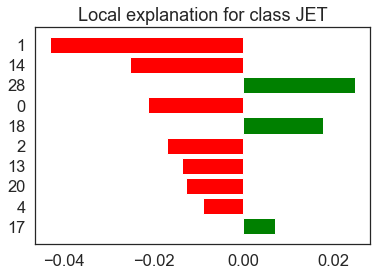

In [217]:
idx = 5
ecg_signal, label = test_dataset[idx]
ecg_signal = ecg_signal.ravel()
explainer = LimeTimeSeriesExplainer(class_names=['Sinus', 'JET'])
num_features = 10
num_slices = 30
exp = explainer.explain_instance(
    ecg_signal, NN_predict_proba, num_features=num_features,
    num_samples=5000, num_slices=num_slices,
    replacement_method='total_mean')
exp.as_pyplot_figure()

0 0.77788866
1 0.22211139


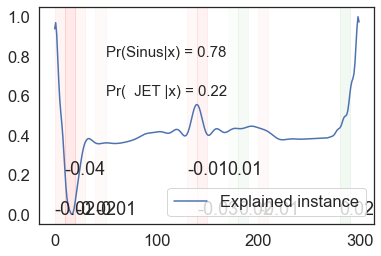

In [224]:




proba = NN_predict_proba(ecg_signal[np.newaxis, :])

values_per_slice = math.ceil(len(ecg_signal) / num_slices)
label_dict = {0: "Sinus", 1: "  JET "}
for i, p in enumerate(proba.ravel()):
    print(i, p)
    plt.text(50, 0.8 - 0.2 * i,
             f"Pr({label_dict[i]}|x) = {p:.2f}", size=15)

plt.plot(ecg_signal, color='b', label='Explained instance')
# plt.plot(ecg_signal, color='#FF0000', linestyle=":", label='Explained instance')

# plt.plot(coffee_test_x.iloc[15:,:].mean(), color='green', label='Mean of other class')
plt.legend(loc='lower right')

for i in range(num_features):
    feature, weight = exp.as_list()[i]
    start = feature * values_per_slice
    end = start + values_per_slice
    color = 'red' if weight < 0 else 'green' 
    plt.axvspan(start, end, color=color, alpha=abs(weight*2))
    plt.text(start, 0.1 * (int(start) % 4), f"{weight:.2f}")
plt.show()

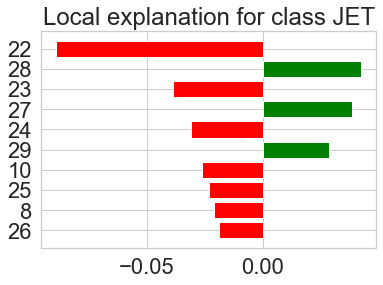

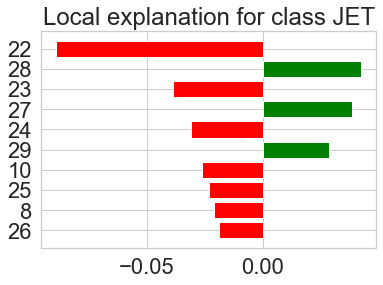

In [155]:
idx = 1000
ecg_signal, label = test_dataset[idx]
ecg_signal = ecg_signal.ravel()
explainer = LimeTimeSeriesExplainer(class_names=['Sinus', 'JET'])
num_features = 10
num_slices = 30
exp = explainer.explain_instance(
    ecg_signal, NN_predict_proba, num_features=num_features,
    num_samples=5000, num_slices=num_slices,
    replacement_method='total_mean')
exp.as_pyplot_figure()

0 0.65399253
1 0.34600747


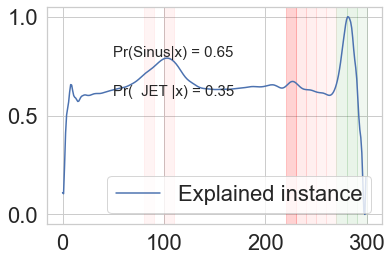

In [156]:






proba = NN_predict_proba(ecg_signal[np.newaxis, :])

values_per_slice = math.ceil(len(ecg_signal) / num_slices)
label_dict = {0: "Sinus", 1: "  JET "}
for i, p in enumerate(proba.ravel()):
    print(i, p)
    plt.text(50, 0.8 - 0.2 * i,
             f"Pr({label_dict[i]}|x) = {p:.2f}", size=15)

plt.plot(ecg_signal, color='b', label='Explained instance')
# plt.plot(ecg_signal, color='#FF0000', linestyle=":", label='Explained instance')

# plt.plot(coffee_test_x.iloc[15:,:].mean(), color='green', label='Mean of other class')
plt.legend(loc='lower right')

for i in range(num_features):
    feature, weight = exp.as_list()[i]
    start = feature * values_per_slice
    end = start + values_per_slice
    color = 'red' if weight < 0 else 'green' 
    plt.axvspan(start , end, color=color, alpha=abs(weight*2))
plt.show()

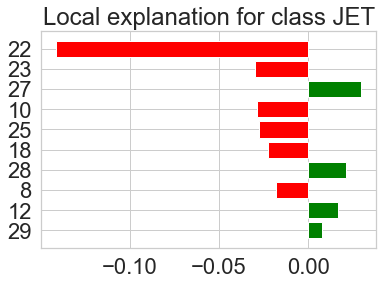

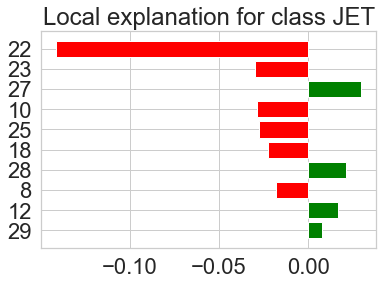

In [157]:
idx = 2000
ecg_signal, label = test_dataset[idx]
ecg_signal = ecg_signal.ravel()
explainer = LimeTimeSeriesExplainer(class_names=['Sinus', 'JET'])
num_features = 10
num_slices = 30
exp = explainer.explain_instance(
    ecg_signal, NN_predict_proba, num_features=num_features,
    num_samples=5000, num_slices=num_slices,
    replacement_method='total_mean')
exp.as_pyplot_figure()

0 0.78006554
1 0.21993445


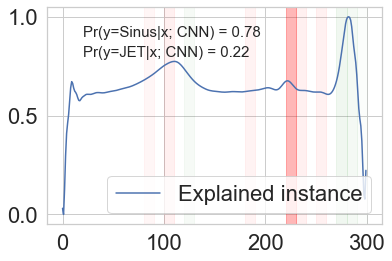

In [158]:






proba = NN_predict_proba(ecg_signal[np.newaxis, :])

values_per_slice = math.ceil(len(ecg_signal) / num_slices)
label_dict = {0: "Sinus", 1: "JET"}
for i, p in enumerate(proba.ravel()):
    print(i, p)
    plt.text(20, 0.9 - 0.1 * i,
             f"Pr(y={label_dict[i]}|x; CNN) = {p:.2f}", size=15)

plt.plot(ecg_signal, color='b', label='Explained instance')
# plt.plot(ecg_signal, color='#FF0000', linestyle=":", label='Explained instance')

# plt.plot(coffee_test_x.iloc[15:,:].mean(), color='green', label='Mean of other class')
plt.legend(loc='lower right')

for i in range(num_features):
    feature, weight = exp.as_list()[i]
    start = feature * values_per_slice
    end = start + values_per_slice
    color = 'red' if weight < 0 else 'green' 
    plt.axvspan(start , end, color=color, alpha=abs(weight*2))
plt.show()

### As a function

In [159]:
num_slices, num_features

(30, 10)

In [82]:
def Show_LIME_explanation_for_idx(idx, dataset, NN_predict_proba,
                                  class_names=None, num_slices=30,
                                  num_features=10, ax=None,
                                  replacement_method="total_mean"):
    if class_names is None:
        class_names = ['Sinus', 'JET']
    ecg_signal, label = dataset[idx]
    ecg_signal = ecg_signal.ravel()
    explainer = LimeTimeSeriesExplainer(class_names=class_names)
    exp = explainer.explain_instance(
        ecg_signal, NN_predict_proba, num_features=num_features,
        num_samples=5000, num_slices=num_slices,
        replacement_method=replacement_method)
    
    Plot_LIME_explanation(ecg_signal, label, NN_predict_proba,
                          exp, num_slices=num_slices, num_features=num_features, ax=ax)

# def Plot_LIME_explanation(ecg_signal, label, NN_predict_proba, exp, num_slices=30, num_features=10, ax=None):
#     if ax is None:
#         ax = plt.gca()
        
#     sns.set(style="white", font_scale=1.5)
#     proba = NN_predict_proba(ecg_signal[np.newaxis, :])
#     values_per_slice = np.ceil(len(ecg_signal) / num_slices).astype(int)
#     label_dict = {0: "Sinus", 1: "JET"}
#     color_dict = {0: cm.tab10(0), 1: cm.tab10(1)}
#     for i, p in enumerate(proba.ravel()):
#         ax.text(20, 0.9 - 0.1 * i,
#                  f"Pr(y={label_dict[i]}|x; CNN) = {p:.2f}", size=15)

#     ax.plot(ecg_signal, color=color_dict[label], label=label_dict[label])
#     ax.legend(loc='lower center')

#     for i in range(num_features):
#         feature, weight = exp.as_list()[i]
#         start = feature * values_per_slice
#         end = start + values_per_slice
#         color = 'red' if weight < 0 else 'green' 
#         ax.axvspan(start, end, color=color, alpha=abs(weight * 2))
        
#     ax.set_xticklabels([])
#     ax.set_yticklabels([])    

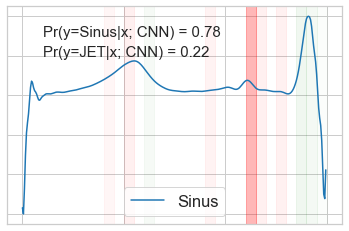

In [161]:
Plot_LIME_explanation(ecg_signal, label, NN_predict_proba, exp)

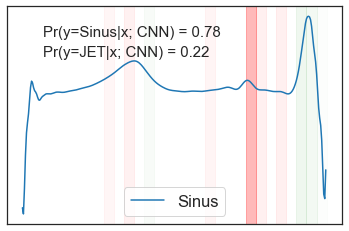

In [162]:
Show_LIME_explanation_for_idx(2000, test_dataset, NN_predict_proba, num_slices=30, num_features=10)

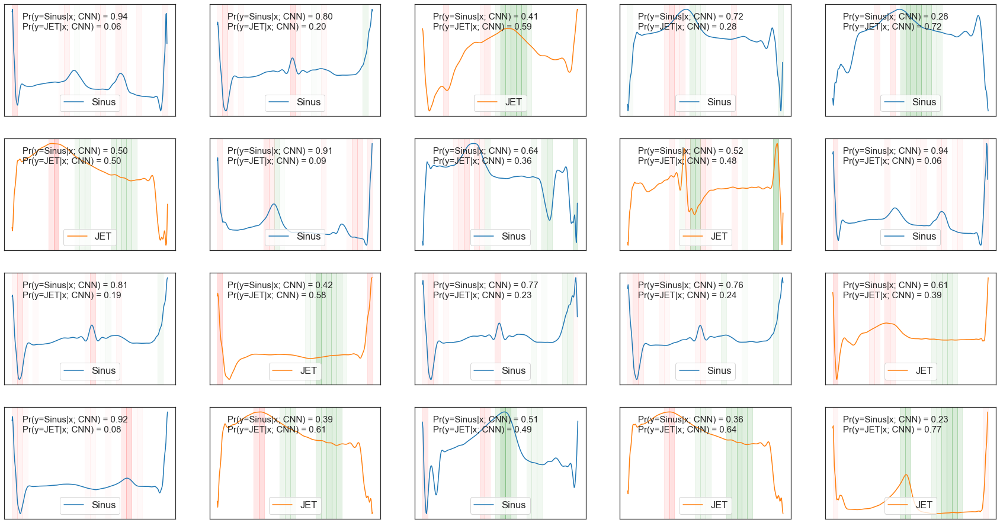

In [163]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(0)
selected_idx_list = np.random.choice(np.arange(len(test_dataset)), size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba, num_slices=30, num_features=10, ax=ax)

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(0)
selected_idx_list = np.random.choice(np.arange(len(test_dataset)), size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba,
                                  num_slices=30, num_features=10, ax=ax,
                                  replacement_method="mean")

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(0)
selected_idx_list = np.random.choice(np.arange(len(test_dataset)), size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba,
                                  num_slices=30, num_features=10, ax=ax,
                                  replacement_method="noise")

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(1)
selected_idx_list = np.random.choice(np.arange(len(test_dataset)), size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba, num_slices=30, num_features=10, ax=ax)

### As a function with ID and adjacent heartbeats

In [43]:
def Filter_data_by_id_dict(ecg_df, id_dict, num_cycle_to_show_each_side=4):
    cycle_ID = ecg_df[
        (ecg_df["patient_ID"] == id_dict["patient_ID"]) \
        & (ecg_df["interval_ID"] == id_dict["interval_ID"]) \
        & (ecg_df["block_ID"] == id_dict["block_ID"]) \
        & (ecg_df["channel_ID"] == id_dict["channel_ID"])
        & (ecg_df["r_ID_abs"] == id_dict["r_ID_abs"])   
    ]["cycle_ID"].values[0]
    ecg_df_selected = ecg_df[
        (ecg_df["patient_ID"] == id_dict["patient_ID"]) \
        & (ecg_df["interval_ID"] == id_dict["interval_ID"]) \
        & (ecg_df["block_ID"] == id_dict["block_ID"]) \
        & (ecg_df["channel_ID"] == id_dict["channel_ID"]) \
        & ((ecg_df["cycle_ID"] <= cycle_ID + num_cycle_to_show_each_side) \
          & (ecg_df["cycle_ID"] >= cycle_ID - num_cycle_to_show_each_side))
    ].sort_values(by=["cycle_ID"], ascending=True)
    return ecg_df_selected, cycle_ID

In [85]:
def Show_LIME_explanation_for_idx_with_id(idx_list, dataset, NN_predict_proba, dataset_id_dict, dataset_df,
                                  class_names=None, num_slices=30, num_cycle_to_show_each_side=4,
                                  num_features=10, target_threshold=0.5, 
                                  replacement_method="total_mean"):
    if class_names is None:
        class_names = ['Sinus', 'JET']
        
    nrow = len(idx_list)
    ncol = 2 * num_cycle_to_show_each_side + 1
    fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
    for i, idx in enumerate(idx_list):
        ecg_signal, label = dataset[idx]
        id_dict = Lookup_ECG(ecg_signal, dataset_id_dict)
        ecg_df_selected, cycle_ID = Filter_data_by_id_dict(dataset_df, id_dict,
                                                           num_cycle_to_show_each_side=num_cycle_to_show_each_side)
#         print(ecg_df_selected)
#         assert len(ecg_df_selected) == ncol
        for j in range(len(ecg_df_selected)):
            ax = axes[i, j]
            cycle_ID_j = ecg_df_selected["cycle_ID"].values[j]
            patient_ID = ecg_df_selected["patient_ID"].values[j]
            ecg_signal = Normalize(ecg_df_selected[dataset.ecg_colnames].values[j, :])
            
            if j == len(ecg_df_selected) // 2:
                ax.set_title(f"Patient ID: {patient_ID}")
            ax.set_ylabel(f"Cycle {cycle_ID_j}")
            
            explainer = LimeTimeSeriesExplainer(class_names=class_names)
            exp = explainer.explain_instance(
                ecg_signal, NN_predict_proba, num_features=num_features,
                num_samples=5000, num_slices=num_slices,
                replacement_method=replacement_method)

            Plot_LIME_explanation(ecg_signal, label, NN_predict_proba, exp, target_threshold=target_threshold, 
                                  num_slices=num_slices, num_features=num_features, ax=ax)
#             return id_dict

In [86]:
def Plot_LIME_explanation(ecg_signal, label, NN_predict_proba, exp,
                          num_slices=30, num_features=10, ax=None, target_threshold=0.5):
    if ax is None:
        ax = plt.gca()
        
    sns.set(style="white", font_scale=1.5)
    proba = NN_predict_proba(ecg_signal[np.newaxis, :]).ravel()
    values_per_slice = np.ceil(len(ecg_signal) / num_slices).astype(int)
    label_dict = {0: "Sinus", 1: "JET"}
    color_dict = {0: cm.tab10(0), 1: cm.tab10(1)}
    for i, p in enumerate(proba):
        ax.text(20, 0.9 - 0.1 * i,
                 f"Pr(y={label_dict[i]}|x; CNN) = {p:.2f}", size=15)
        
    if proba[1] < target_threshold and label == 1:
        error = "FN"
        error_color = f"#FF00FF"
    elif proba[1] > target_threshold and label == 0:
        error = "FP"
        error_color = f"#FF0000"
    else:
        error = None
        error_color = None

    ax.plot(ecg_signal, color=color_dict[label], label=f"True label: {label_dict[label]}")
    if error is not None:
        ax.text(0.05 * len(ecg_signal), 0.1, error, color=error_color)
    ax.legend(loc='lower center')

    slice_intervals = np.arange(0, len(ecg_signal) + 1, values_per_slice)
    slice_interval_midpoint_list = [(slice_intervals[i] + slice_intervals[i + 1]) / 2 \
                                for i in range(len(slice_intervals) - 1)]
    interval_val_tuple_list = []
    for i in range(num_features):
        feature, weight = exp.as_list()[i]
        start = feature * values_per_slice
        end = start + values_per_slice
        color = 'red' if weight < 0 else 'green' 
        ax.axvspan(start, end, color=color, alpha=abs(weight * 2))
#         print(i, start, end)
#         ax.text(start, 0.1, f"{weight:.2f}") # This is the coefficient of the feature (slice)
                                             # learned by the underlying linear model
        interval_val_tuple_list.append((start, end, weight))
    ax_twinx = ax.twinx()
    
    interval_val_list = []
    for slice_interval_midpoint in slice_interval_midpoint_list:
        for j, interval_val_tuple in enumerate(interval_val_tuple_list):
            if slice_interval_midpoint > interval_val_tuple[0] and slice_interval_midpoint < interval_val_tuple[1]:
                interval_val_list.append(interval_val_tuple[2])
                break
        else:
            interval_val_list.append(0)

#     print(len(slice_interval_midpoint_list), slice_interval_midpoint_list)
#     print(len(interval_val_list), interval_val_list)
    ax_twinx.bar(x=slice_interval_midpoint_list, height=interval_val_list, color="#000000", width=0.5 * values_per_slice)
    ax_twinx.set_ylim(np.minimum(0, 2 * np.min(interval_val_list)),
                      np.maximum(0, 2 * np.max(interval_val_list)))
    ax_twinx.set_ylim(-0.25, 0.25)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax_twinx.set_yticklabels([])    

### False negatives

In [ ]:
dataset_plot = test_dataset
dataset_id_dict = dataset_id_dict_test

In [334]:
target_threshold

0.4129362106323242

selected_idx_list: [ 85434 106897  87847 103214  85859]


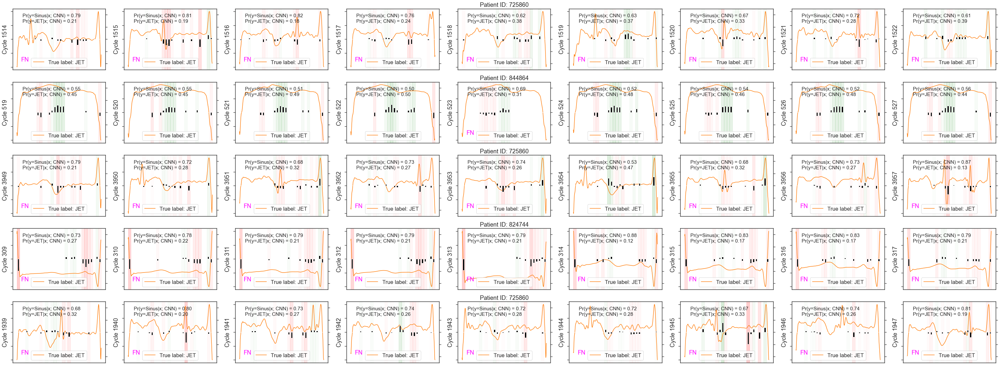

In [336]:
np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[1], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

selected_idx_list: [ 34222  87468 102805  95447  86798]


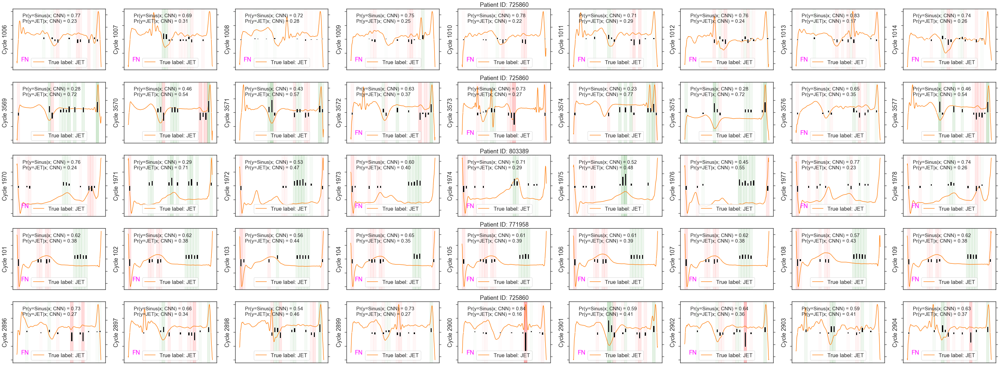

In [337]:
np.random.seed(1)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[1], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

selected_idx_list: [ 85045  84407  33261  96803 101806]


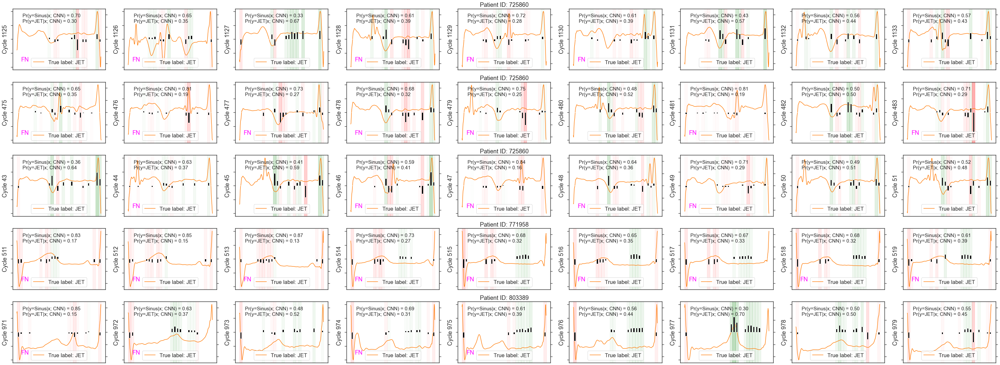

In [338]:
np.random.seed(2)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[1], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

selected_idx_list: [ 95936 100203 102559 100536  34455]


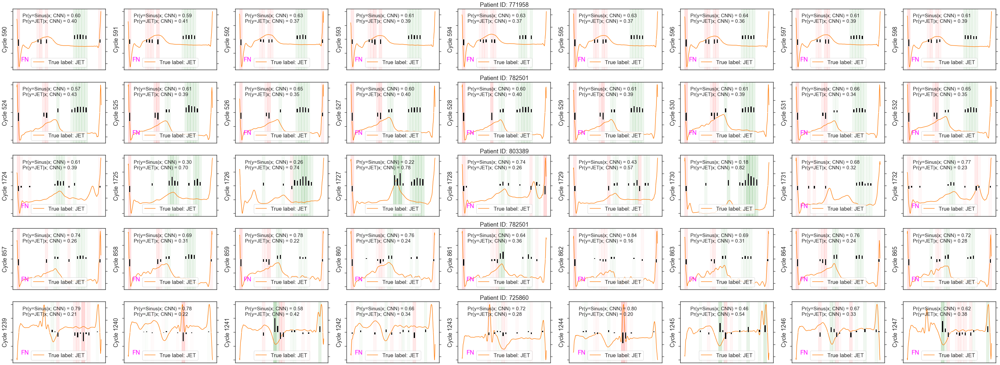

In [339]:
np.random.seed(4)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[1], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(0)
selected_idx_list = np.random.choice(wrong_indices_dict_test[1], size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
print(selected_idx_list)
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba, num_slices=30, num_features=10, ax=ax)

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(0)
selected_idx_list = np.random.choice(wrong_indices_dict_test[1], size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
print(selected_idx_list)
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba, num_slices=30, num_features=10, ax=ax)

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(1)
selected_idx_list = np.random.choice(wrong_indices_dict_test[1], size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
print(selected_idx_list)
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba, num_slices=30, num_features=10, ax=ax)

### False positives

selected_idx_list: [ 5591 52305  2824 16244  6661]


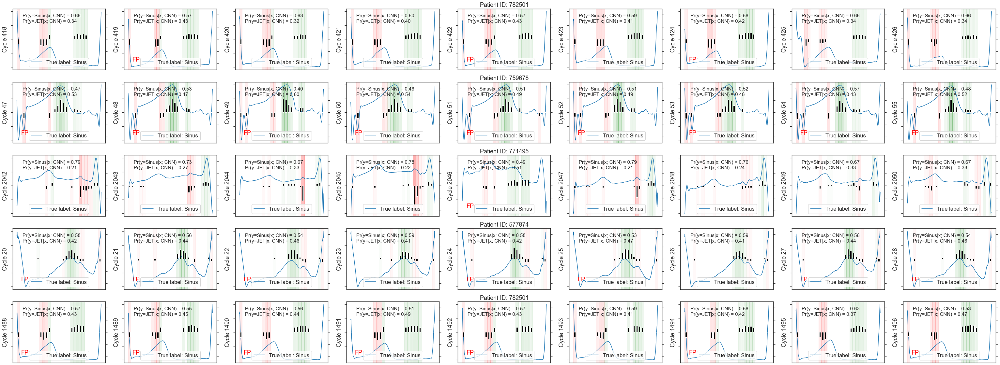

In [340]:
np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[0], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

selected_idx_list: [53112  9794 52834 52391  6502]


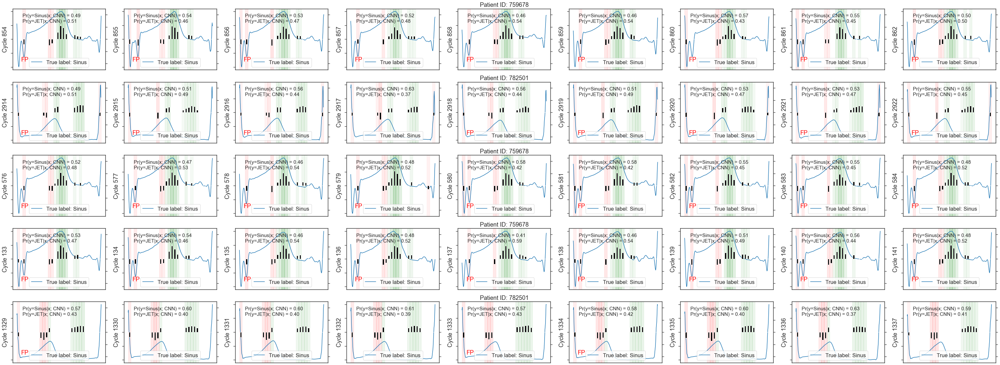

In [341]:
np.random.seed(1)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[0], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

selected_idx_list: [ 53377 111996   8379   9669   7219]


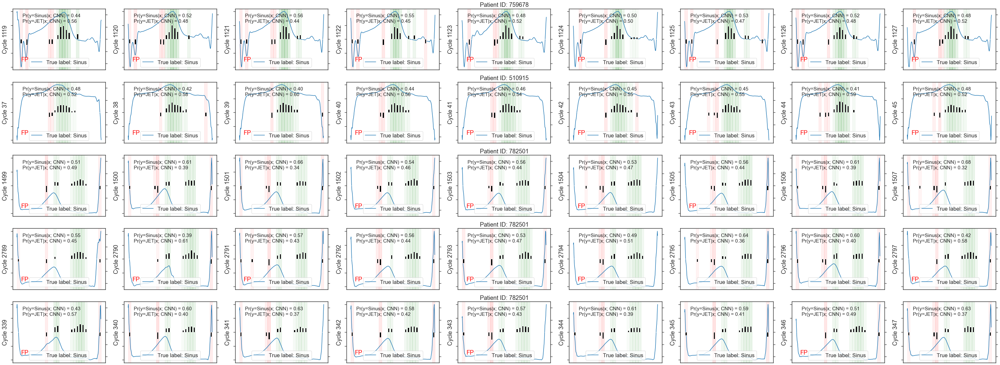

In [342]:
np.random.seed(2)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[0], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

selected_idx_list: [  9350 112196   7524  52926  12970]


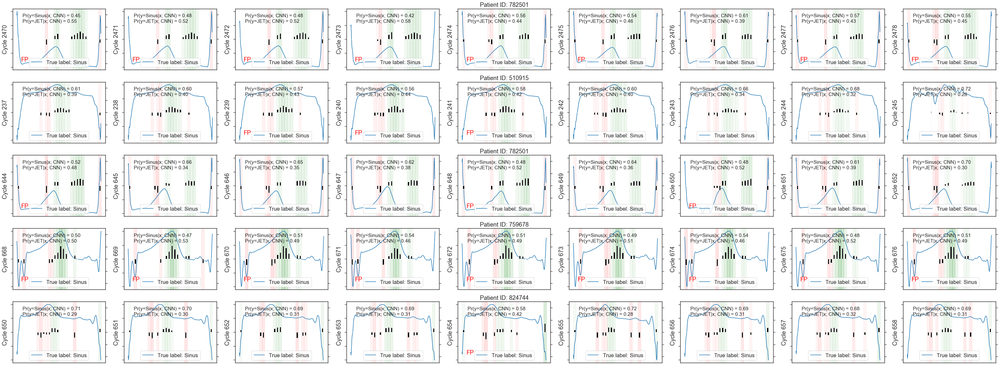

In [343]:
np.random.seed(3)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(wrong_indices_dict_test[0], size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_test_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(0)
selected_idx_list = np.random.choice(wrong_indices_dict_test[0], size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
print(selected_idx_list)
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba, num_slices=30, num_features=10, ax=ax)

In [ ]:
dataset_plot = test_dataset
show_num = 20
ncol = 5
nrow = np.ceil(show_num / ncol).astype(int)
np.random.seed(1)
selected_idx_list = np.random.choice(wrong_indices_dict_test[0], size=show_num, replace=False)
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow))
print(selected_idx_list)
for i, idx in enumerate(selected_idx_list):
    r = i // ncol
    c = i % ncol
    ax = axes[r, c]
    Show_LIME_explanation_for_idx(idx, dataset_plot, NN_predict_proba, num_slices=30, num_features=10, ax=ax)

## Summary

In [106]:
idx_list = wrong_indices_dict_train[0] + wrong_indices_dict_train[1]
# idx_list = wrong_indices_dict_test[0] + wrong_indices_dict_test[1]

dataset_plot = train_dataset
dataset_id_dict = dataset_id_dict_train

short_identifier_list = dataset_plot.short_identifier_list
error_df_dict = dict.fromkeys(short_identifier_list)
for k in error_df_dict:
    error_df_dict[k] = []
    
error_idx_by_patient_by_type = {0: {}, 1: {}}
for i, idx in enumerate(idx_list):
    ecg_signal, label = dataset_plot[idx]
    id_dict = Lookup_ECG(ecg_signal, dataset_id_dict)
    for k, v in id_dict.items():
        error_df_dict[k].append(v)
    if id_dict["patient_ID"] in error_idx_by_patient_by_type[label]:
        error_idx_by_patient_by_type[label][id_dict["patient_ID"]].append(idx)
    else:
        error_idx_by_patient_by_type[label][id_dict["patient_ID"]] = [idx]
        
error_df = pd.DataFrame.from_dict(error_df_dict)

In [107]:
error_df

,patient_ID,interval_ID,block_ID,channel_ID,r_ID_abs,label,r_ID_abs_ref
0,398573,8748912,1,2,19730,0,19730
1,398573,8748912,1,2,20832,0,20832
2,398573,8748912,1,2,22216,0,22216
3,398573,8748912,1,2,22490,0,22490
4,398573,8748912,1,2,22627,0,22627
...,...,...,...,...,...,...,...
13448,678877,8749319,1,2,4188,1,4188
13449,678877,8749320,1,2,1245,1,1245
13450,678877,8749320,1,2,2018,1,2018
13451,678877,8749320,1,2,2128,1,2128


In [108]:
error_df_summary = error_df.groupby(["patient_ID", "label"]).agg({"r_ID_abs": "count"}).reset_index()
error_df_summary = error_df_summary.rename(columns={"patient_ID": "Patient ID", "r_ID_abs": "Count", "label": "Label"})
error_df_summary["Error Type"] = "FP"
error_df_summary.loc[error_df_summary["Label"] == 1, "Error Type"] = "FN"
error_df_summary

,Patient ID,Label,Count,Error Type
0,398573,0,1464,FP
1,398573,1,20,FN
2,417349,0,314,FP
3,417349,1,2,FN
4,537854,0,19,FP
5,537854,1,58,FN
6,551554,0,403,FP
7,551554,1,92,FN
8,624179,0,204,FP
9,624179,1,106,FN


#### Train

In [109]:
error_df_summary["Patient ID"].unique()

array([398573, 417349, 537854, 551554, 624179, 628521, 631270, 637891,
       655769, 662493, 667681, 678877], dtype=int64)

In [93]:
error_df_summary["Count"].sum(), 10284 / error_df_summary["Count"].sum()

(16997, 0.6050479496381714)

In [110]:
target_threshold

0.29838496446609497

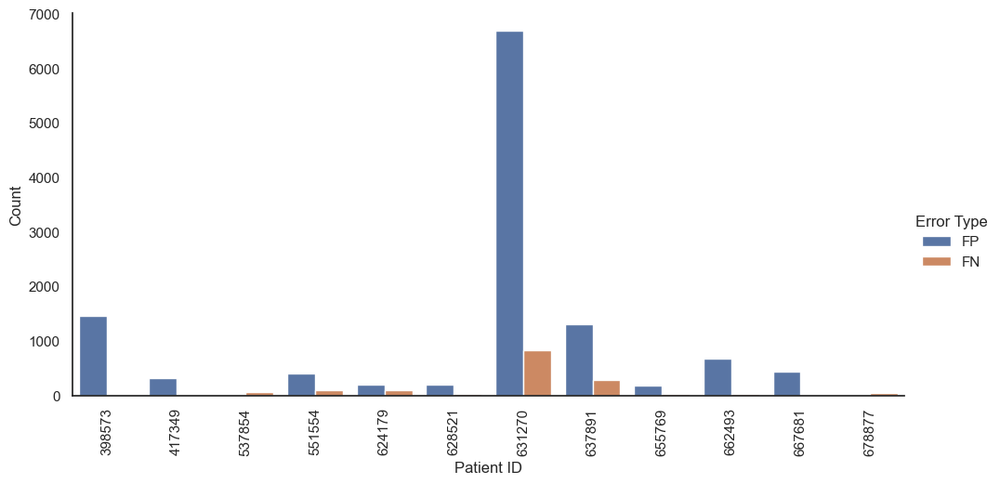

In [111]:
sns.set(style="white")
g = sns.catplot(data=error_df_summary, x="Patient ID", y="Count", hue="Error Type", kind="bar", height=5, aspect=2)
for i, ax_row in enumerate(g.axes):
    for j, ax in enumerate(ax_row):
        for tick in ax.get_xticklabels():
            tick.set_rotation(90)
            

#### Test

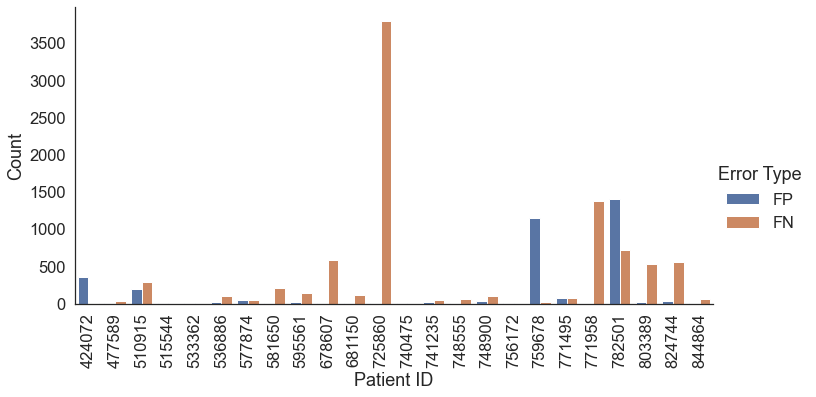

In [368]:
g = sns.catplot(data=error_df_summary, x="Patient ID", y="Count", hue="Error Type", kind="bar", height=5, aspect=2)
for i, ax_row in enumerate(g.axes):
    for j, ax in enumerate(ax_row):
        for tick in ax.get_xticklabels():
            tick.set_rotation(90)

In [376]:
error_df_summary[error_df_summary["Patient ID"].isin([725860, 759678, 771958, 782501])]

,Patient ID,Label,Count,Error Type
20,725860,0,5,FP
21,725860,1,3797,FN
30,759678,0,1147,FP
31,759678,1,23,FN
34,771958,1,1378,FN
35,782501,0,1404,FP
36,782501,1,721,FN


In [377]:
error_df_summary[error_df_summary["Patient ID"].isin([725860, 759678, 771958, 782501])].groupby(["Error Type"]).agg({"Count": "sum"})

,Count
Error Type,
FN,5919
FP,2556


In [372]:
error_df_summary.groupby(["Error Type"]).agg({"Count": "sum"})

,Count
Error Type,
FN,8883
FP,3427


In [373]:
len(feature_with_ecg_df_test_single_lead.query(f"label == 0")), len(feature_with_ecg_df_test_single_lead.query(f"label == 1"))

(68589, 45823)

In [369]:
len(test_dataset)

114412

\# Test data S = 114412

FN = 8883

FN1 = 5919 (66.63%)

FP = 3427

FP1 = 2556 (74.58%)

P = TP + FN = 45823

TP = 45823 - FN = 36940

True positive rate TPR = TP / (TP + FN) = 80.61453855050957%

TP1 = P - (FN - FN1) = 45823 - 2964 = 42859

TP1 / P = 42859 / 45823 = 93.53%

### Plot by patients

#### 631270 FP (label = 0)

In [123]:
target_threshold

0.29838496446609497

selected_idx_list: [135754 124797 124333 118257 139698]


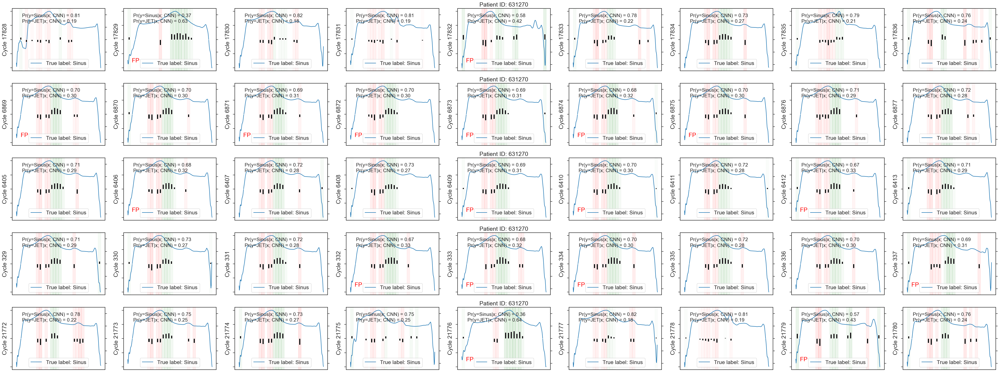

In [116]:
patient_ID = 631270
label = 0
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

#### 398573 FP (label = 0)

selected_idx_list: [181769   6490 181097 182590   1238]


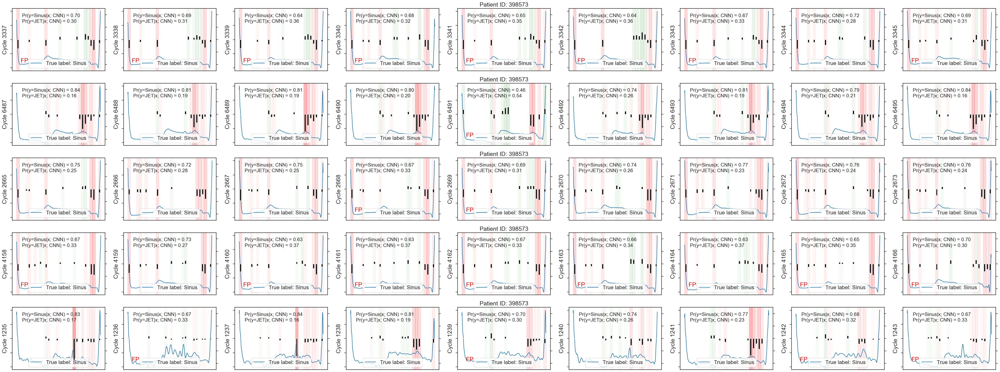

In [117]:
patient_ID = 398573
label = 0
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

#### 637891 FP (label = 0)

selected_idx_list: [171331 171656 171059 171645 158715]


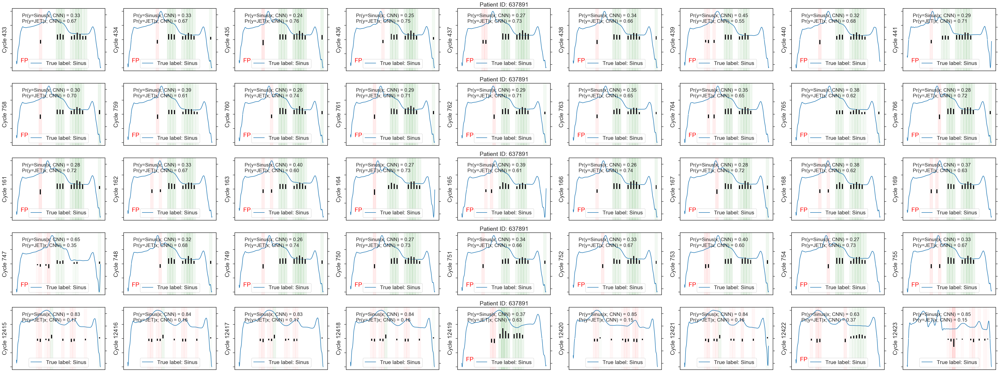

In [118]:
patient_ID = 637891
label = 0
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

#### 662493 FP (label = 0)

selected_idx_list: [209877 208592 208056 207313 202921]


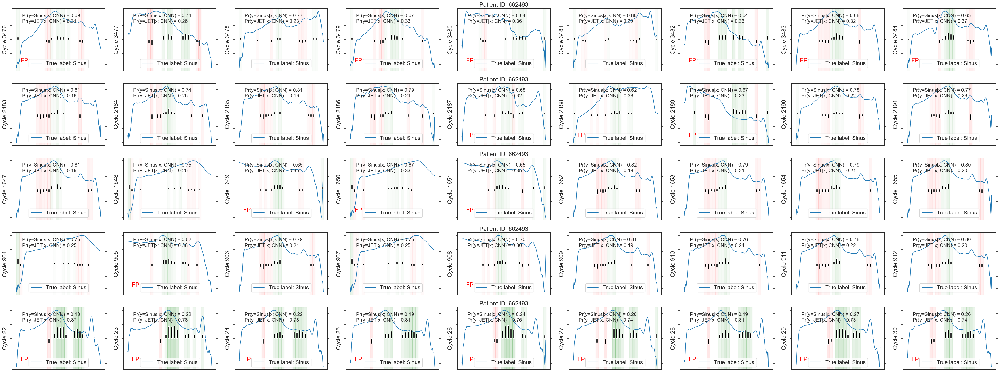

In [119]:
patient_ID = 662493
label = 0
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

#### 667681 FP (label = 0)

selected_idx_list: [213814 217063 214341 217031 213312]


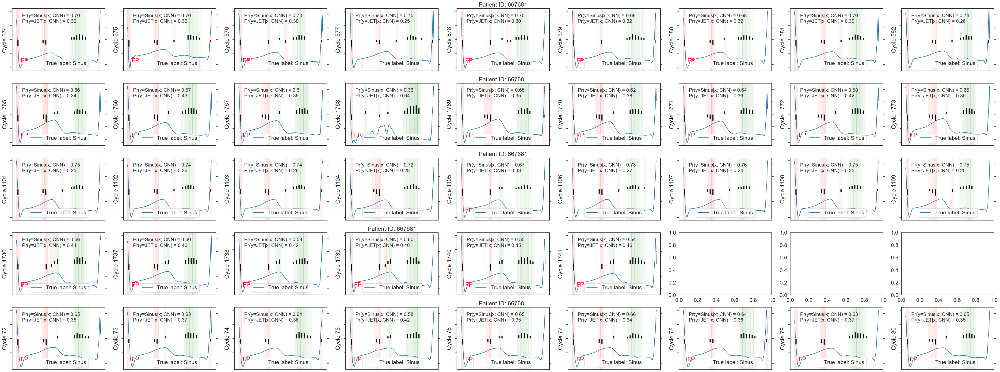

In [120]:
patient_ID = 667681
label = 0
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

#### 637891 FN (label = 1)

selected_idx_list: [276042 278957 276079 281520 282961 276032 276098 282438 276001 276008]


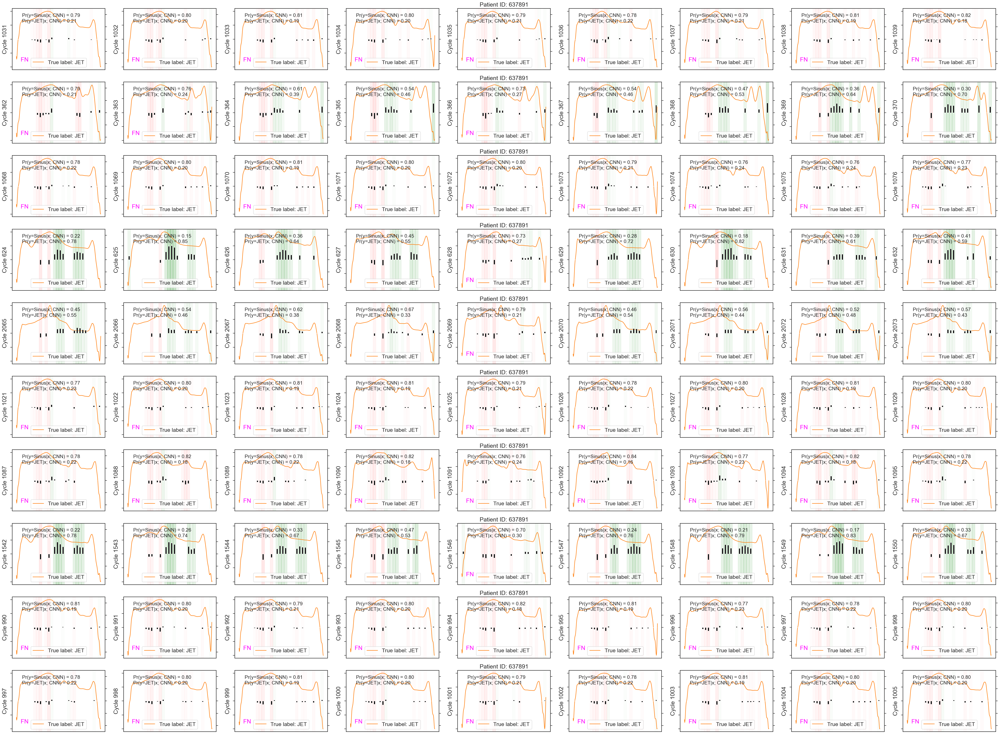

In [121]:
patient_ID = 637891
label = 1
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 10
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

#### 631270 FN (label = 1)

selected_idx_list: [274677 268763 262677 270802 274675]


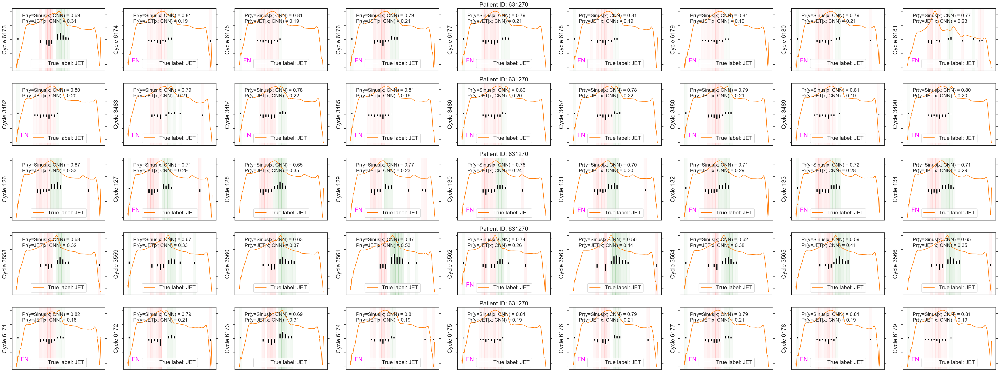

In [122]:
patient_ID = 631270
label = 1
idx_list = error_idx_by_patient_by_type[label][patient_ID]
dataset_id_dict = dataset_id_dict_train

np.random.seed(0)
show_num = 5
num_cycle_to_show_each_side = 4
selected_idx_list = np.random.choice(idx_list, size=show_num, replace=False)
print(f"selected_idx_list: {selected_idx_list}")

Show_LIME_explanation_for_idx_with_id(
    selected_idx_list, dataset_plot, NN_predict_proba, 
    dataset_id_dict, feature_with_ecg_df_train_single_lead, target_threshold=target_threshold, 
    num_slices=30, num_features=10, num_cycle_to_show_each_side=num_cycle_to_show_each_side)

## GradCAM

https://ai-fast-track.github.io/timeseries/cam_tutorial_ECG200/

In [84]:
from fastai.basics import *
from timeseries.all import *

RuntimeError: tensor.H is only supported on matrices (2-D tensors). Got 1-D tensor.

In [87]:
import fastai
fastai.__version__

'2.0.19'

In [ ]:
%reload_ext autoreload
%autoreload 2

In [ ]:
import fastcore
fastcore.__version__

In [71]:
np.random.randint(0, 10000)

4781

In [76]:
counter = 0
for i in range(4781 + 1):
    i_str = str(i)
    for c in i_str:
        if c == '0':
            counter += 1
counter

1349

In [77]:
np.log(900) / np.log(6)

3.7964888034078546